<a href="https://colab.research.google.com/github/JuanESteban201817451/prueba_hb_juan/blob/main/Prueba_Data_Science.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Prueba Data Scientist Habi**

---



## **Antes de empezar**, por favor guarde este notebook como una copia personal, para no editar la versión original de esta. Esto lo puede hacer en File->Save a copy in Drive

In [1]:
## Solo correr en version Colab
import os

if not os.path.exists("prueba_hb_juan"):
    !git clone https://github.com/JuanESteban201817451/prueba_hb_juan.git

%cd prueba_hb_juan

## instalar paquetes
!pip install -r /content/prueba_hb_juan/requirements.txt

# Para ver los widgets
from google.colab import output
output.enable_custom_widget_manager()

/content/prueba_hb_juan


## **Punto 1**


---



Descargar base de datos de UPLs (subdivisión urbana para Bogotá) y de inmuebles, todo con código. Es decir, utilizando las librerías necesarias para extraer datos desde internet sin necesidad de leerlos de manera local. Sugerimos la librería urllib.

* UPLs: 'https://datosabiertos.bogota.gov.co/dataset/808582fc-ffc8-4649-8428-7e1fd8d3820c/resource/a5c8c591-0708-420f-8eb7-9f3147e21c40/download/unidadplaneamientolocal.json'
* Inmuebles: 'https://storage.googleapis.com/pruebas-data-analitica/inmuebles_full.csv.gz'

Esta segunda tabla tiene información de inmuebles publicados en páginas web.


In [2]:
# Activar la extensión de autoreload
%load_ext autoreload
%autoreload 2

In [17]:
# Modulo Propio
from utils.descarga import ExtractorDatosRemotos,extraer_procesos_xml
from utils.mapas_y_graficas import widget_mapa_1,graficar_upl_vs_inmuebles,analizar_interseccion_codigos,widget_tabla_propiedades,analizar_categoricas,visualizar_tabla_geografica,analizar_numericas,graficar_percentil_histograma,analizar_lisa_interactiva
from utils.cruces_geograficos import asignar_upl_contains, cruzar_puntos_con_upl, preparar_upls
from utils.procesador import estandarizar_codigo, obtener_centroides,imputar_area_anomala,corregir_valores_grandes,imputar_precio
from utils.pipe_modelo import ejecutar_pipeline

In [18]:
# bibliotexas Externas
from scipy.spatial.distance import pdist
import numpy as np
from IPython.display import display
import pandas as pd
import geopandas as gpd
import xml.etree.ElementTree as ET
from shapely.geometry import Point
from shapely.prepared import prep
from shapely.ops import unary_union
from tqdm import tqdm
import missingno as msno
import matplotlib.pyplot as plt
tqdm.pandas()  # activa tqdm para apply
pd.set_option('display.max_columns', None) # Mostrar todas las columnas

In [19]:
carpeta_destino="/content/prueba_hb_juan/data/interim"

In [20]:
# 1. Unidad de Planeamiento Local (.json → GeoDataFrame)
url_upl = 'https://datosabiertos.bogota.gov.co/dataset/808582fc-ffc8-4649-8428-7e1fd8d3820c/resource/a5c8c591-0708-420f-8eb7-9f3147e21c40/download/unidadplaneamientolocal.json'
upl = ExtractorDatosRemotos(url_upl,carpeta_destino=carpeta_destino)
ruta_upl = upl.descargar_y_guardar()

Archivo ya existe localmente en: /content/prueba_hb_juan/data/interim/unidadplaneamientolocal.json


In [21]:
#Carga
gdf_upl = upl.cargar_desde_local(ruta_upl)
display(gdf_upl.head())

,OBJECTID,CODIGO_UPL,NOMBRE,ACTO_ADMINISTRATIVO,NUMERO_ACTO_ADMINISTRATIVO,FECHA_ACTO_ADMINISTRATIVO,NORMATIVA,VOCACION,OBSERVACION,AREA_HA,SECTOR,ESCALA_CAPTURA,FECHA_CAPTURA,RESPONSABLE,RULEID,SHAPE_Length,SHAPE_Area,geometry
0,1,UPL13,Tintal,DEC,555,1640736000000,En el marco del Decreto 555 del 29 de diciembr...,Urbano-Rural,Que mediante Resolución 2050 del 23 de noviemb...,1284.993710,Sector Sur Occidente,,1669161600000,553,1,0.154174,0.001046,"POLYGON ((-74.16957 4.65632, -74.16955 4.65631..."
1,2,UPL30,Salitre,DEC,555,1640736000000,En el marco del Decreto 555 del 29 de diciembr...,Urbano,Que mediante Resolución 2050 del 23 de noviemb...,1578.491209,Sector Occidente,,1669161600000,553,1,0.144109,0.001285,"POLYGON ((-74.09471 4.66478, -74.10058 4.65718..."
2,3,UPL22,Restrepo,DEC,555,1640736000000,En el marco del Decreto 555 del 29 de diciembr...,Urbano,Que mediante Resolución 2050 del 23 de noviemb...,1075.501295,Sector Centro Ampliado,,1669161600000,553,1,0.143360,0.000876,"POLYGON ((-74.10459 4.56467, -74.10468 4.56482..."
3,4,UPL31,Puente Aranda,DEC,555,1640736000000,En el marco del Decreto 555 del 29 de diciembr...,Urbano,Que mediante Resolución 2050 del 23 de noviemb...,1731.114624,Sector Centro Ampliado,,1669161600000,553,1,0.161116,0.001410,"POLYGON ((-74.08320 4.62470, -74.08400 4.62371..."
4,5,UPL32,Teusaquillo,DEC,555,1640736000000,En el marco del Decreto 555 del 29 de diciembr...,Urbano,Que mediante Resolución 2050 del 23 de noviemb...,1419.316994,Sector Centro Ampliado,,1669161600000,553,1,0.148314,0.001156,"POLYGON ((-74.07160 4.61775, -74.07283 4.61542..."


In [8]:
# 2. Inmuebles (.csv.gz → DataFrame)
url_inmuebles = 'https://storage.googleapis.com/pruebas-data-analitica/inmuebles_full.csv.gz'
inmuebles = ExtractorDatosRemotos(url_inmuebles,carpeta_destino=carpeta_destino)
ruta_inmuebles = inmuebles.descargar_y_guardar()

Archivo ya existe localmente en: /content/prueba_hb_juan/data/interim/inmuebles_full.csv.gz


In [9]:
#Carga
df_inmuebles = inmuebles.cargar_desde_local(ruta_inmuebles)
display(df_inmuebles.head())

,id,fecha_creacion,latitud,longitud,departamento,municipio,habitaciones,banos,area,precio,num_ascensores,garajes,direccion,anos_antiguedad,tipo_inmueble,tiponegocio
0,3669162,2022-03-02,3.36400,-76.495003,VALLE DEL CAUCA,CALI,3.0,2,81.0,2.640000e+08,0,1,Carrera 99A # 45 - 200 Apto 706 Torre 3 Lili d...,12,apartamento,venta
1,3067524,2021-12-12,6.14300,-75.601997,ANTIOQUIA,SABANETA,2.0,3,90.0,4.600000e+08,1,2,Calle 70A SUR # 35 - 340 Apto 3402 Urbanizacio...,4,apartamento,venta
2,3944108,2022-03-18,4.89866,-74.043427,CUNDINAMARCA,CAJICÁ,3.0,4,140.0,1.000000e+09,0,4,abaco,4,casa,venta
3,500215,2020-07-23,6.12084,-75.425949,ANTIOQUIA,RIONEGRO,3.0,2,75.0,1.600000e+06,0,1,CALLE 32 52B- 150,1,apartamento,arriendo
4,741346,2020-09-15,4.93952,-73.982620,CUNDINAMARCA,SOPÓ,4.0,5,750.0,3.300000e+09,0,6,AUTOPISTA NORTE KM 33,12,casa,venta


## **Punto 2**

---



Hacer un join espacial entre la base de datos de UPLs e inmuebles y
calcular cuántas ofertas inmobiliarias existen en Bogotá por UPL. Para esto sugerimos usar la librería de GeoPandas.

In [ ]:
# Crear columna de geometría
geometry = [Point(xy) for xy in zip(df_inmuebles['longitud'], df_inmuebles['latitud'])]

# Mostrar ambos CRS
print("CRS gdf_upl:", gdf_upl.crs)

# Crear GeoDataFrame
gdf_inmuebles = gpd.GeoDataFrame(df_inmuebles, geometry=geometry, crs="EPSG:4686")

**Cruce espacial por geometrías**

El cruce debe realizarse utilizando las **geometrías espaciales**, principalmente mediante la verificación de si **cada punto está contenido dentro de alguna de las UPL**. Por esta razón, se filtrará la base de datos, pero antes se realizará una revisión del **comportamiento gráfico**.

---

**Hipótesis**

Dado que se trata de **UPL de Bogotá**, se espera cubrir principalmente las áreas correspondientes a **Bogotá D.C.** Sin embargo, es posible que algunas propiedades ubicadas en los **límites de la ciudad** aparezcan registradas como pertenecientes a **Cundinamarca**, a pesar de estar **dentro del área de cobertura de una UPL de Bogotá**.

Esto podría deberse a **errores de los usuarios** al ingresar la información, especialmente si proviene de **fuentes en línea**, como portales inmobiliarios, donde es común que se **confunda el departamento** o se seleccione incorrectamente entre **Bogotá** y **Cundinamarca**.

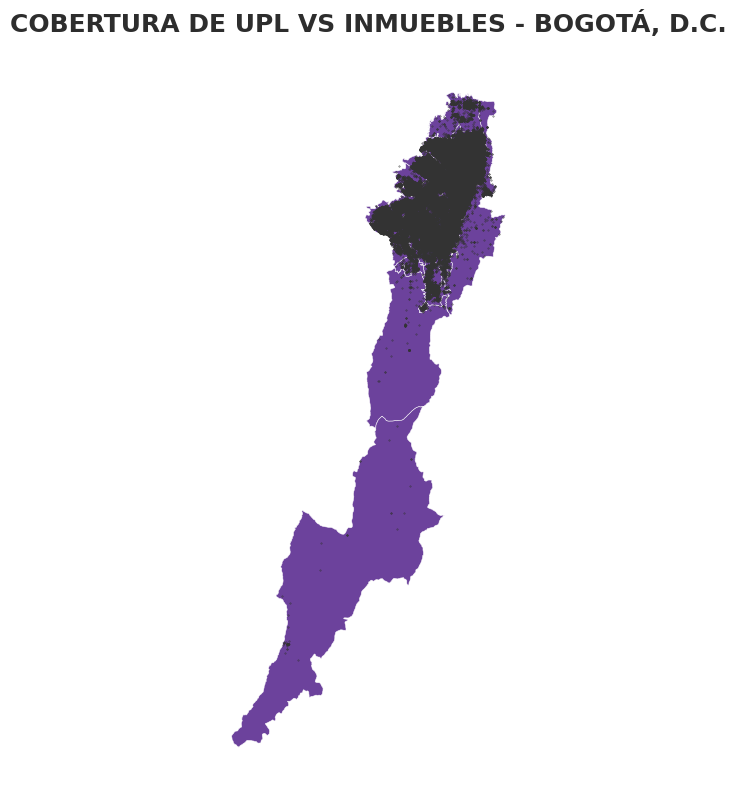

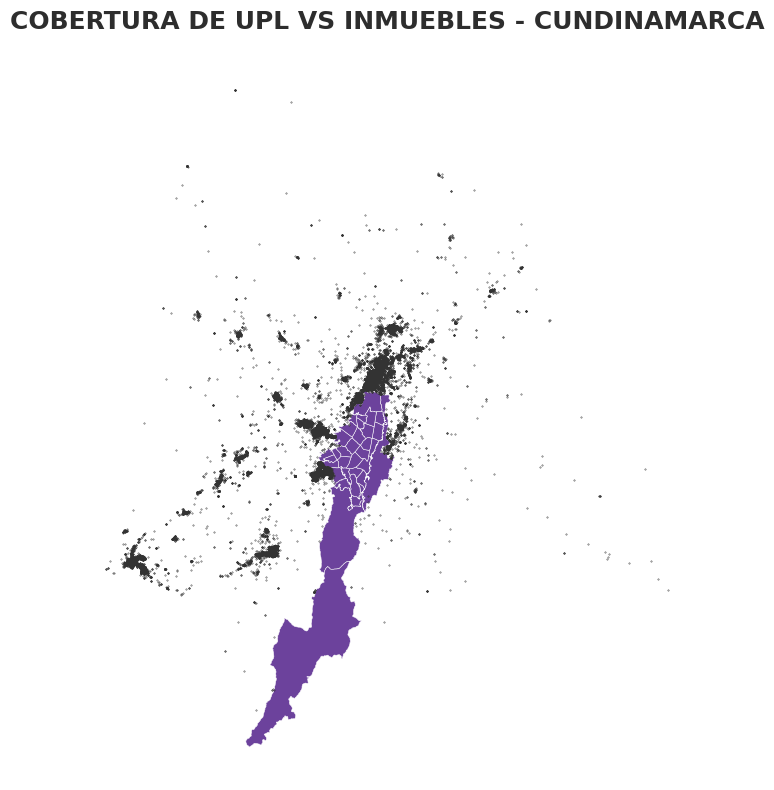

In [11]:
graficar_upl_vs_inmuebles(gdf_upl, gdf_inmuebles, departamento="BOGOTÁ, D.C.")
graficar_upl_vs_inmuebles(gdf_upl, gdf_inmuebles, departamento="CUNDINAMARCA")

**Filtro Geográfico**

Para evitar redundancias en el código y optimizar el algoritmo de cruce, se realizará primero un **filtro geográfico preliminar**. Este filtro selecciona **todas las propiedades que se encuentran dentro del polígono general de las UPL de Bogotá**.

Una vez identificados los **posibles candidatos**, se aplicará sobre ellos el cruce geométrico detallado con las UPL individuales, garantizando así **eficiencia computacional** y **precisión espacial**.

In [12]:
# Crear el polígono general que agrupa todos
poligono_general = unary_union(gdf_upl.geometry)

# Preparar el polígono para acelerar las comparaciones
poligono_preparado = prep(poligono_general)

# Aplicar el filtro con map
mascara = gdf_inmuebles.geometry.map(poligono_preparado.contains)
gdf_inmuebles_filtrado = gdf_inmuebles[mascara]

In [13]:
## Visualizar
visualizar_tabla_geografica(gdf_inmuebles_filtrado.query("departamento =='CUNDINAMARCA'"))

Son pocas propiedades y todas estan en el limite de area de interes por eso se van a eliminar del estudio

In [14]:
gdf_inmuebles_filtrado=gdf_inmuebles_filtrado.query('departamento=="BOGOTÁ, D.C."').reset_index(drop=True)

**Valores Faltantes**

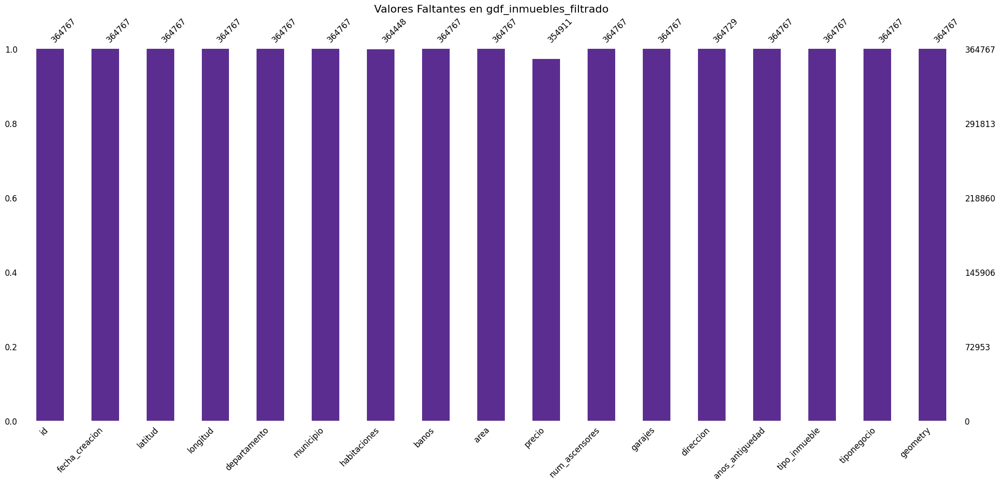

In [15]:
# Gráfico de barras de valores faltantes
msno.bar(gdf_inmuebles_filtrado, fontsize=12, color="#5C2D91")
plt.title("Valores Faltantes en gdf_inmuebles_filtrado", fontsize=16)
plt.show()

**Vamos a hacer imputacion de precios, primo revisar que las demas variables esten bien**

## Revision Preliminar de datos:
Entender que hay en la data

In [16]:
# Definimos manualmente según tu contexto
columnas_categoricas = ['departamento', 'municipio', 'tipo_inmueble', 'tiponegocio',
                        'habitaciones', 'banos', 'anos_antiguedad', 'num_ascensores', 'garajes']

columnas_numericas = ['area', 'precio']

 **Columna:** departamento
 Número de categorías únicas: 1
 Top 10 categorías más frecuentes:
              Frecuencia
BOGOTÁ, D.C.      364767
 **Columna:** municipio
 Número de categorías únicas: 1
 Top 10 categorías más frecuentes:
              Frecuencia
BOGOTÁ, D.C.      364767
 **Columna:** tipo_inmueble
 Número de categorías únicas: 2
 Top 10 categorías más frecuentes:
             Frecuencia
apartamento      302828
casa              61939
 **Columna:** tiponegocio
 Número de categorías únicas: 2
 Top 10 categorías más frecuentes:
          Frecuencia
venta         256873
arriendo      107894
 **Columna:** habitaciones
 Número de categorías únicas: 35
 Top 10 categorías más frecuentes:
      Frecuencia
3.0       183058
2.0        80514
4.0        39941
1.0        39856
5.0         9372
6.0         4338
7.0         2258
8.0         1848
9.0         1145
10.0         852
 **Columna:** banos
 Número de categorías únicas: 5
 Top 10 categorías más frecuentes:
   Frecuencia
2      16

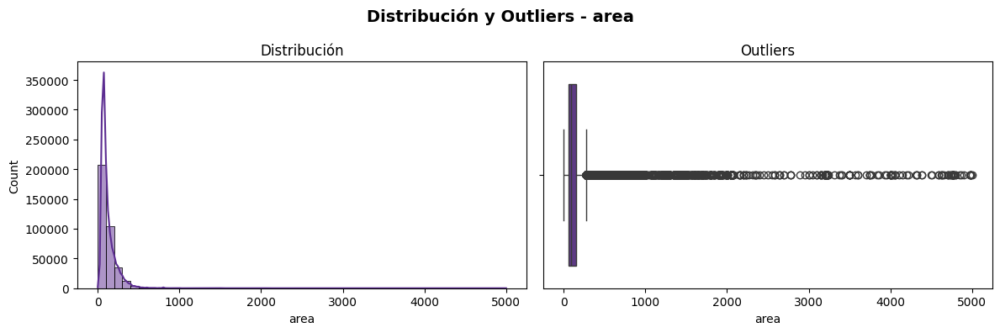


**Variable numérica:** precio

- Estadísticas para `precio` en VENTA (en millones):
count    256873.000000
mean        705.368155
std         662.088777
min          45.000000
0%           45.000000
5%          198.000000
10%         241.000000
15%         275.000000
20%         300.000000
25%         330.000000
30%         360.000000
35%         390.000000
40%         420.000000
45%         455.000000
50%         495.000000
55%         545.000000
60%         590.000000
65%         650.000000
70%         730.000000
75%         830.000000
80%         950.000000
85%        1150.000000
90%        1395.000000
95%        1895.280000
100%       9999.999999
max        9999.999999
Name: precio, dtype: float64


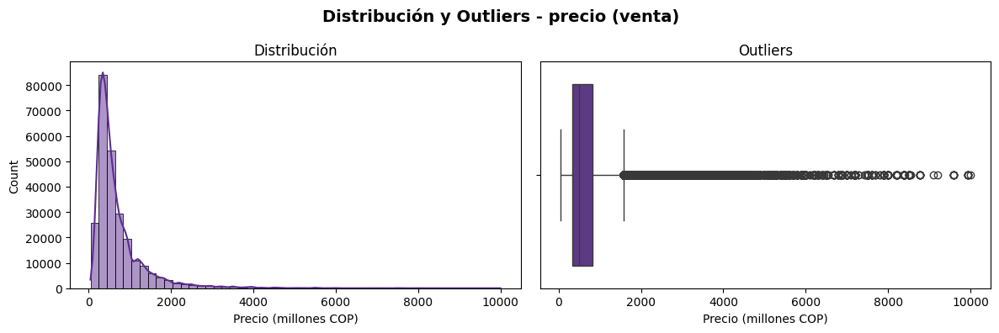


- Estadísticas para `precio` en ARRIENDO (en millones):
count    9.803800e+04
mean     7.737530e+02
std      1.382927e+05
min      5.000000e-02
0%       5.000000e-02
5%       1.000000e+00
10%      1.150000e+00
15%      1.240000e+00
20%      1.300000e+00
25%      1.400000e+00
30%      1.500000e+00
35%      1.600000e+00
40%      1.750000e+00
45%      1.850000e+00
50%      2.000000e+00
55%      2.200000e+00
60%      2.400000e+00
65%      2.600000e+00
70%      3.000000e+00
75%      3.400000e+00
80%      4.000000e+00
85%      4.900000e+00
90%      6.500000e+00
95%      9.909000e+00
100%     2.500000e+07
max      2.500000e+07
Name: precio, dtype: float64


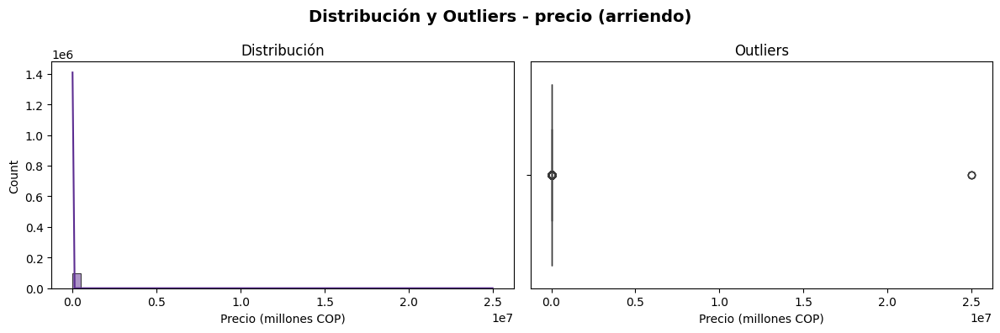

In [17]:
# Ejecutar análisis
analizar_categoricas(gdf_inmuebles_filtrado, columnas_categoricas)
analizar_numericas(gdf_inmuebles_filtrado, columnas_numericas)

Se encontraron casos donde hay 2 numeros como si el usuario pusiera un rango de precios y el lector no sea capas de reconocerlo para estos casos se arregla asi.

In [18]:
gdf_inmuebles_filtrado.iloc[91155]['precio']

25000001700000.0

In [19]:
df_corregido, registro_cambios = corregir_valores_grandes(gdf_inmuebles_filtrado)
registro_cambios

,id,precio_viejo,precio_nuevo
0,3213542,2.500000e+13,2100000.0
1,2584815,2.500000e+13,2100000.0
2,3492038,2.500000e+13,2100000.0


**Corregir Tipo negocio**

Hay claras razones para pensar que propiedades de arriendo estan en venta y al contrario.

 **Variable:** precio | Percentiles 97-99.5
count    2.552000e+03
mean     3.252634e+07
std      5.456646e+07
min      1.300000e+07
25%      1.500000e+07
50%      1.700000e+07
75%      2.100000e+07
max      2.900000e+08
Name: precio, dtype: float64


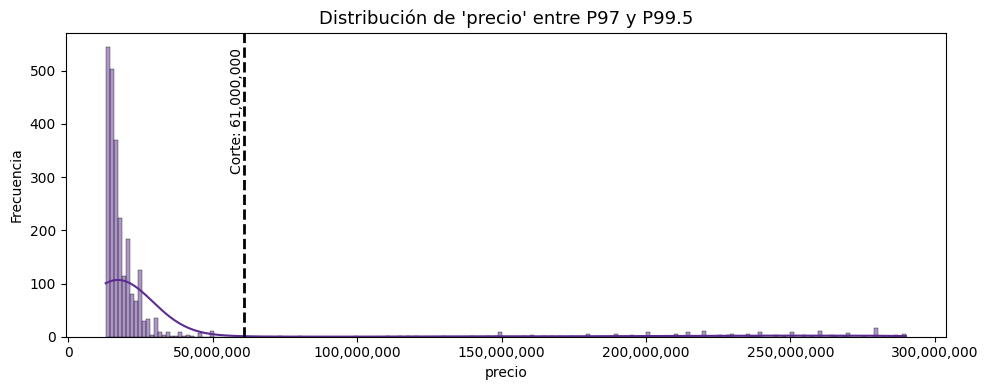

In [20]:
# Revisar percentiles bajos sin línea
graficar_percentil_histograma(df_corregido.query("tiponegocio=='arriendo'"), "precio", 97, 99.5,linea_corte=61_000_000)

 **Variable:** precio | Percentiles 0-5
count    1.296400e+04
mean     1.576565e+08
std      2.905620e+07
min      4.500000e+07
25%      1.400000e+08
50%      1.649970e+08
75%      1.800000e+08
max      1.980000e+08
Name: precio, dtype: float64


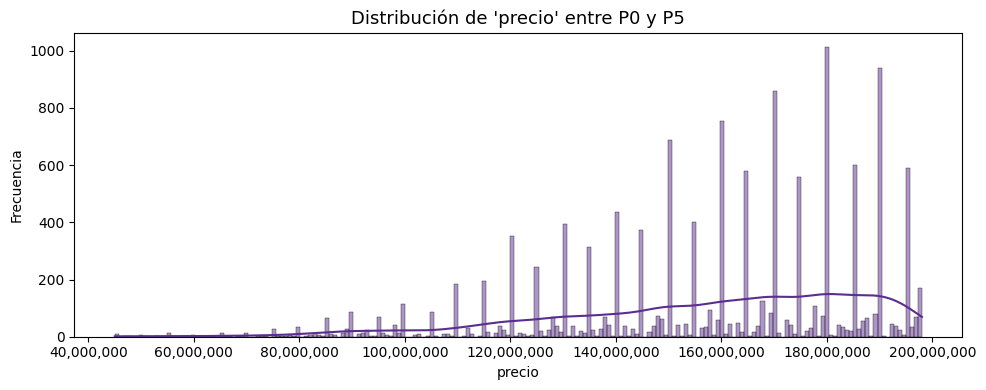

In [21]:
# Revisar percentiles bajos sin línea
graficar_percentil_histograma(df_corregido.query("tiponegocio=='venta'"), "precio", 0, 5)

In [22]:
umbral = 60_500_000  # cambia este valor si deseas otro umbral (Revisando la distribucion y los datos)
df_corregido.loc[(df_corregido['tiponegocio'] == 'arriendo') & (df_corregido['precio'] > umbral), 'tiponegocio'] = 'venta'


**Variable numérica:** area
count    364767.00000
mean        126.47065
std         129.00475
min           1.00000
0%            1.00000
5%           45.00000
10%          52.00000
15%          57.00000
20%          61.00000
25%          65.00000
30%          70.00000
35%          74.00000
40%          79.00000
45%          85.00000
50%          90.00000
55%          98.00000
60%         107.00000
65%         118.00000
70%         132.00000
75%         150.00000
80%         171.00000
85%         200.00000
90%         240.00000
95%         303.00000
100%       4998.00000
max        4998.00000
Name: area, dtype: float64


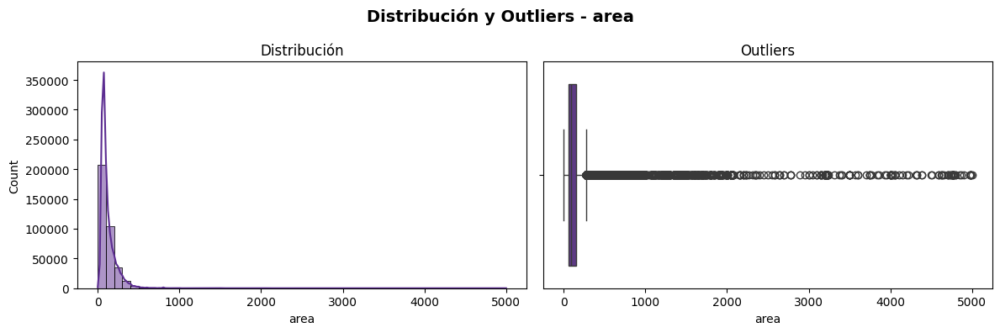


**Variable numérica:** precio

- Estadísticas para `precio` en VENTA (en millones):
count    257541.000000
mean        705.701282
std         667.487755
min          45.000000
0%           45.000000
5%          198.000000
10%         240.000000
15%         274.050000
20%         300.000000
25%         330.000000
30%         360.000000
35%         390.000000
40%         420.000000
45%         454.000000
50%         495.000000
55%         540.000001
60%         590.000000
65%         650.000000
70%         730.000000
75%         830.000000
80%         950.000000
85%        1150.000000
90%        1395.000000
95%        1900.000000
100%      16000.000000
max       16000.000000
Name: precio, dtype: float64


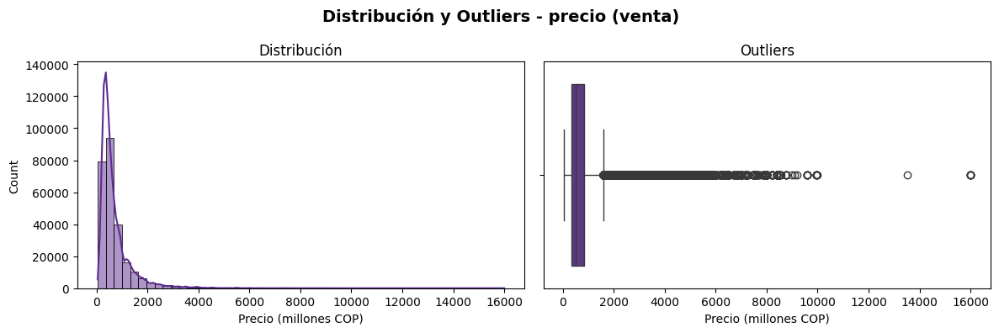


- Estadísticas para `precio` en ARRIENDO (en millones):
count    97370.000000
mean         3.083311
std          3.234594
min          0.050000
0%           0.050000
5%           1.000000
10%          1.150000
15%          1.234070
20%          1.300000
25%          1.400000
30%          1.500000
35%          1.600000
40%          1.717000
45%          1.850000
50%          2.000000
55%          2.200000
60%          2.400000
65%          2.600000
70%          2.910000
75%          3.350000
80%          3.900000
85%          4.700000
90%          6.000000
95%          9.000000
100%        60.000000
max         60.000000
Name: precio, dtype: float64


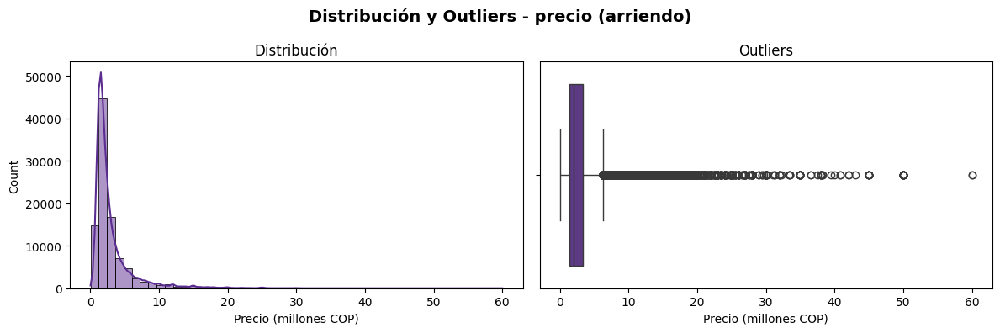

In [23]:
## Nuevas Distribuciones
analizar_numericas(df_corregido, columnas_numericas)

**Variable de area**

Vamos a analizar la variable área, enfocándonos en identificar apartamentos o casas que, aparentemente, tienen un tamaño excepcionalmente grande pero con precios relativamente bajos.

Hipótesis: Es posible que, en algunos casos, el sistema de lectura de información en línea no interprete correctamente las comas decimales. Por ejemplo, una propiedad con un área de 100,1 m² podría registrarse erróneamente como 1001 m², o una de 89,59 m² como 8959 m². Este tipo de errores puede inflar artificialmente el tamaño de las propiedades en los datos recopilados.

Además, aprovecharemos el hecho de que las casas suelen tener áreas más grandes que los apartamentos para dividir la distribución y facilitar la identificación de posibles inconsistencias o valores atípicos.

**Ademas Hechos Estilizados:**

Propiedad Residencial Más Grande en Bogotá:
Según la información disponible en línea, una de las propiedades residenciales más grandes actualmente en venta en Bogotá es una casa ubicada en el sector de Suba, con un área construida de 1.900 m². Esta propiedad está listada en el portal Properati y se ofrece por un valor de $5.000.000.000 COP.

**Metodo de imputacion**


 **Variable:** area | Percentiles 0-5
count    15624.000000
mean        37.561663
std          6.113966
min          1.000000
25%         35.000000
50%         40.000000
75%         42.000000
max         44.000000
Name: area, dtype: float64


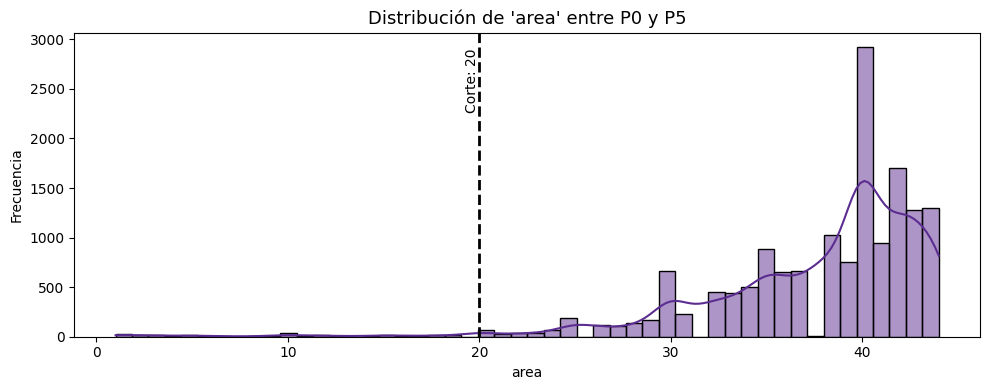

In [24]:
# Revisar percentiles bajos sin línea
graficar_percentil_histograma(df_corregido.query("tipo_inmueble=='apartamento'"), "area", 0, 5,50,20)

 **Variable:** area | Percentiles 0-5
count    3105.00000
mean       54.33315
std        15.38491
min         1.00000
25%        48.00000
50%        60.00000
75%        65.00000
max        69.00000
Name: area, dtype: float64


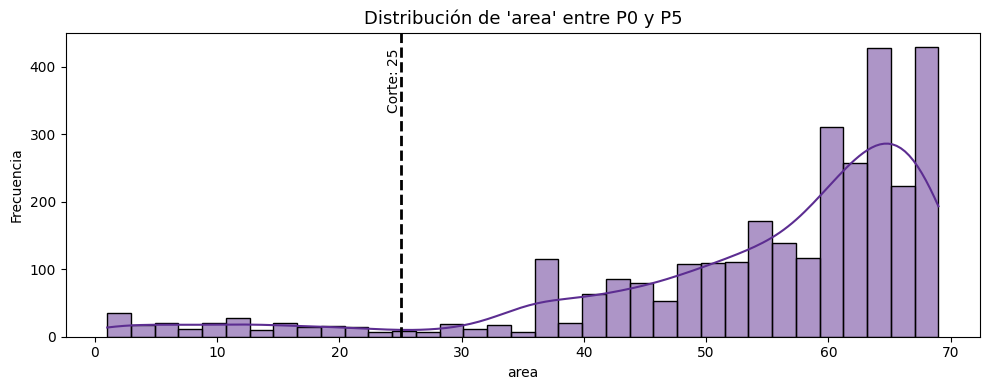

In [25]:
# Revisar percentiles bajos sin línea
graficar_percentil_histograma(df_corregido.query("tipo_inmueble=='casa'"), "area", 0, 5,35,25)

 **Variable:** area | Percentiles 98-100
count    1245.000000
mean     1275.027711
std       645.758700
min       753.000000
25%       800.000000
50%      1000.000000
75%      1500.000000
max      4800.000000
Name: area, dtype: float64


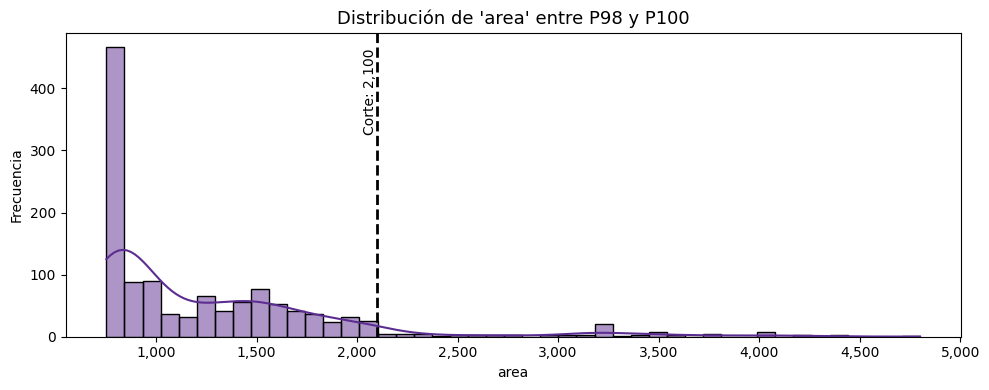

In [26]:
# Revisar percentiles bajos sin línea
graficar_percentil_histograma(df_corregido.query("tipo_inmueble=='casa'"), "area", 98, 100,45,2100)

In [27]:
df_corregido_area,cambios=imputar_area_anomala(df_corregido)
cambios.head(50)

,id,area_original,area_imputada,metodo
0,580653,18.00,78.525833,estimada
1,3898372,4050.00,40.500000,alternativa_40.50
2,4376895,6.00,158.968013,estimada
3,3170056,19.00,19.000000,alternativa_19.00
4,1319216,20.00,20.000000,alternativa_20.00
5,3734397,9.00,246.696905,estimada
6,4358818,1.00,100.000000,alternativa_100.00
7,849945,11.00,1428.127723,estimada
8,4448293,20.00,20.000000,alternativa_20.00
9,3105208,2160.00,95.468403,estimada


**Revisar la variable precio**
Vamos a imputar valores y ademas revisar la distribucion

In [28]:
df_corregido_area_precio,df_corregido_precio=imputar_precio(df_corregido_area)
df_corregido_precio

Imputando precios: 100%|██████████| 10521/10521 [39:09<00:00,  4.48it/s]


,id,precio_original,precio_imputado,metodo
0,1487762,NaN,2.001691e+06,vecinos_proximos
1,1542842,NaN,9.384834e+05,vecinos_proximos
2,1548308,NaN,1.580951e+06,vecinos_proximos
3,1493602,NaN,1.088914e+06,vecinos_proximos
4,1576209,NaN,1.215591e+06,vecinos_proximos
...,...,...,...,...
10516,1530820,NaN,1.440216e+06,vecinos_proximos
10517,1509375,NaN,1.398572e+06,vecinos_proximos
10518,1514642,NaN,1.405088e+06,vecinos_proximos
10519,1502559,NaN,1.475114e+06,vecinos_proximos


In [29]:
df_corregido_precio

,id,precio_original,precio_imputado,metodo
0,1487762,NaN,2.001691e+06,vecinos_proximos
1,1542842,NaN,9.384834e+05,vecinos_proximos
2,1548308,NaN,1.580951e+06,vecinos_proximos
3,1493602,NaN,1.088914e+06,vecinos_proximos
4,1576209,NaN,1.215591e+06,vecinos_proximos
...,...,...,...,...
10516,1530820,NaN,1.440216e+06,vecinos_proximos
10517,1509375,NaN,1.398572e+06,vecinos_proximos
10518,1514642,NaN,1.405088e+06,vecinos_proximos
10519,1502559,NaN,1.475114e+06,vecinos_proximos


In [30]:
## Revision de H:
print("Deparatamentos involucrados: ", df_corregido_area_precio['departamento'].unique())

## Corregir Impresiciones
df_corregido_area_precio=df_corregido_area_precio.copy()
df_corregido_area_precio['m2_propiedad']=df_corregido_area_precio['precio']/df_corregido_area_precio['area']

## Revision de H:
print("Deparatamentos involucrados version corregida: ", df_corregido_area_precio['departamento'].unique())

## Revisar si hay propiedades duplicadas
es_unica = df_corregido_area_precio['id'].is_unique
print("¿ID Es única?: ", es_unica)

## Revision de contenido por si es una base auto increment
columnas_sin_id = [col for col in df_corregido_area_precio.columns if col != 'ID']

duplicados = df_corregido_area_precio.duplicated(subset=columnas_sin_id)
hay_duplicados = duplicados.any()
print("¿Hay duplicados en el contenido (ignorando la columna 'ID', que podría ser un autoincremental)?: ", hay_duplicados)

# Filtramos la columnas de UPLS para aligerar el manejo
variables_importantes_upl=["CODIGO_UPL","NOMBRE","VOCACION","SECTOR","AREA_HA","geometry"]
gdf_upl_filtrado=gdf_upl[variables_importantes_upl]

Deparatamentos involucrados:  ['BOGOTÁ, D.C.']
Deparatamentos involucrados version corregida:  ['BOGOTÁ, D.C.']
¿ID Es única?:  True
¿Hay duplicados en el contenido (ignorando la columna 'ID', que podría ser un autoincremental)?:  False


**Cruce Geo Espacial.**

In [31]:
gdf_inmuebles_filtrado=df_corregido_area_precio

In [32]:
upls_preparados = preparar_upls(gdf_upl_filtrado)

# UPLS
gdf_inmuebles_filtrado = cruzar_puntos_con_upl(
    gdf_puntos=gdf_inmuebles_filtrado,
    upls_preparados=upls_preparados,
    metodo_cruce=asignar_upl_contains,
    col_salida='CODIGO_UPL'
)

Aplicando cruce: CODIGO_UPL: 100%|██████████| 364767/364767 [00:54<00:00, 6686.98it/s]


In [33]:
gdf_inmuebles_filtrado['imputado'] = (
    (gdf_inmuebles_filtrado['area_imputada'] == 1) |
    (gdf_inmuebles_filtrado['precio_imputado'] == 1)
).astype(int)

In [34]:
df_mapa_upls=gdf_inmuebles_filtrado.groupby(['CODIGO_UPL', 'departamento','tiponegocio','tipo_inmueble','imputado']).agg(
    ofertas=('id', 'count'),
    precio_total=('precio', 'sum'),
    area_promedio=('area','mean'),
    area_total=('area','sum'),
    m2_pormedio_propiedad=('m2_propiedad','mean')
).reset_index().merge(gdf_upl_filtrado, on='CODIGO_UPL')

In [35]:
# Mostrar la tabla formateada
df_resumen=df_mapa_upls.groupby(["NOMBRE", "CODIGO_UPL"]).agg(
    ofertas=('ofertas', 'sum'),
) \
    .sort_values(by="ofertas", ascending=False) \
    .reset_index()

In [36]:
df_resumen

,NOMBRE,CODIGO_UPL,ofertas
0,Usaquén,UPL25,104775
1,Chapinero,UPL24,61630
2,Niza,UPL27,34948
3,Britalia,UPL08,27014
4,Teusaquillo,UPL32,17935
5,Salitre,UPL30,15419
6,Toberín,UPL26,14609
7,Barrios Unidos,UPL33,11034
8,Centro Histórico,UPL23,10543
9,Tintal,UPL13,9093


## **Punto 3**


---



Use una visualización que permita ver cuántas ofertas de inmuebles existen por UPL.

In [37]:
df_m1=df_mapa_upls.groupby(['CODIGO_UPL','departamento']).agg(
    ofertas=('ofertas', 'sum'),
    precio_total=('precio_total', 'sum'),
    area_total=('area_total','sum'),
    imputado=('imputado','sum')
)\
    .sort_values(by="ofertas", ascending=False) \
    .reset_index().merge(gdf_upl_filtrado, on='CODIGO_UPL')
df_m1["m2_pormedio"]=df_m1['precio_total']/df_m1['area_total']

In [38]:
widget_mapa_1(df_m1)

##  **Visualización Interactiva de UPLs y Ofertas Inmobiliarias en Bogotá**

# **Punto 4**

Hacer una i de Moran para saber las UPLs HH, HL, LH y LL según el modelo para el valor por m2 de los inmuebles por UPL.

**Guía de Medidas para Análisis Espacial por UPL**

A continuación se presentan dos formas comunes de estimar el valor promedio por metro cuadrado en una Unidad de Planeamiento Local (UPL). Cada una responde a una lógica distinta de análisis y tiene implicaciones diferentes según el tipo de actor que analiza o participa en el mercado.

---

**1. Precio promedio por metro cuadrado total en la UPL**

$$
\text{Precio total por m}^2 = \frac{\sum_{i=1}^{N_{\text{UPL}}} \text{Precio}_i}{\sum_{i=1}^{N_{\text{UPL}}} \text{Área}_i}
$$

Esta medida representa el **precio por metro cuadrado ponderado por el tamaño de cada propiedad**. Propiedades más grandes influyen más en el cálculo. Es útil para describir el valor agregado del suelo en la zona o el costo promedio para actores que adquieren grandes volúmenes (como inversionistas o fondos inmobiliarios).

---

**2. Precio promedio del metro cuadrado por propiedad**

$$
\text{Precio promedio m}^2\text{ por propiedad} = \frac{1}{N_{\text{UPL}}} \sum_{i=1}^{N_{\text{UPL}}} \left( \frac{\text{Precio}_i}{\text{Área}_i} \right)
$$

Esta medida calcula el precio por metro cuadrado **individualmente para cada propiedad**, y luego promedia esos valores. Es más representativa de la experiencia de un **comprador individual** que adquiere un único inmueble.

---

**Comparación entre ambas medidas**

| **Medida**                             | **Ponderación**      | **Interpretación y uso principal**                                                   |
|---------------------------------------|----------------------|----------------------------------------------------------------------------------------|
| Precio total por m²                   | Ponderada por área   | Refleja el valor agregado de mercado. Útil para análisis de portafolios o inversión.  |
| Precio promedio m² por propiedad      | No ponderada         | Representa la experiencia promedio de un comprador individual en la zona.             |



In [ ]:
## Vamos a restringir el analisis a Venta vamos a sacar arriendo y eliminar los imputados

columnas_unicas = ['NOMBRE', 'VOCACION', 'SECTOR', 'geometry']

df_filtrado = df_mapa_upls.query("tiponegocio == 'venta' & imputado==0")

df_m2_upls = df_filtrado.groupby('CODIGO_UPL').apply(
    lambda g: pd.Series({
        'ofertas': g['ofertas'].sum(),
        'precio_total': g['precio_total'].sum(),
        'area_total': g['area_total'].sum(),
        'area_promedio': (g['area_promedio'] * g['ofertas']).sum() / g['ofertas'].sum(),
        'm2_promedio_propiedad': (g['m2_pormedio_propiedad'] * g['ofertas']).sum() / g['ofertas'].sum(),
        'NOMBRE': g['NOMBRE'].iloc[0],
        'VOCACION': g['VOCACION'].iloc[0],
        'SECTOR': g['SECTOR'].iloc[0],
        'geometry': g['geometry'].iloc[0]
    })
).reset_index().sort_values(by='m2_promedio_propiedad', ascending=False).reset_index(drop=True)
df_m2_upls["m2_pormedio"]=df_m2_upls['precio_total']/df_m2_upls['area_total']

In [ ]:
# === Cargar datos y preparar ===
gdf = gpd.GeoDataFrame(df_m2_upls, geometry=df_m2_upls.geometry, crs="EPSG:4686")
gdf_resultado = analizar_lisa_interactiva(
    gdf=gdf,
    variables=['m2_promedio_propiedad', 'm2_pormedio'],
    k_vecinos=5,
    alpha=0.05,
    nombre_columna='NOMBRE'
)


Moran Global para m2_promedio_propiedad
I de Moran: 0.4981, p-valor: 0.0010


c:\Users\juane\Documents\prueba_hb_juan\utils\mapas_y_graficas.py:591: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.





Moran Global para m2_pormedio
I de Moran: 0.4135, p-valor: 0.0010


c:\Users\juane\Documents\prueba_hb_juan\utils\mapas_y_graficas.py:591: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




In [ ]:
# === Cargar datos y preparar ===
gdf = gpd.GeoDataFrame(df_m2_upls, geometry=df_m2_upls.geometry, crs="EPSG:4686")
gdf_resultado = analizar_lisa_interactiva(
    gdf=gdf,
    variables=['m2_promedio_propiedad', 'm2_pormedio'],
    k_vecinos=5,
    alpha=0.3,
    nombre_columna='NOMBRE'
)


Moran Global para m2_promedio_propiedad
I de Moran: 0.4981, p-valor: 0.0010


c:\Users\juane\Documents\prueba_hb_juan\utils\mapas_y_graficas.py:591: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.





Moran Global para m2_pormedio
I de Moran: 0.4135, p-valor: 0.0010


c:\Users\juane\Documents\prueba_hb_juan\utils\mapas_y_graficas.py:591: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




# **Punto 5**

Hacer el modelo de predicción de precios de su preferencia para valorar los inmuebles proporcionados y presentar el MAPE y RMSE del resultado.

**Modelo Estructural Teórico para la Predicción del Precio**

 **Objetivo**

Estimar el precio de una propiedad en el área metropolitana de Bogotá utilizando información física, geográfica y temporal del inmueble. La función objetivo busca modelar la relación entre estas variables y el precio reportado.

---

 **Representación funcional**

$$
\hat{P}_i = f(\text{tiponegocio}_i, \text{departamento}_i, \text{municipio}_i, \text{tipo\_inmueble}_i, \text{habitaciones}_i, \text{banos}_i, \text{anos\_antiguedad}_i, \text{num\_ascensores}_i, \text{garajes}_i, \text{area}_i) + \varepsilon_i
$$

Donde:
- \( \hat{P}_i \): Precio estimado de la propiedad \( i \)
- \( f(\cdot) \): Función estructural no lineal aprendida por el modelo
- \( \varepsilon_i \): Término de error asociado a factores no observados

---

 **Variables explicativas**

| Variable              | Tipo        | Descripción técnica                                                    |
|-----------------------|-------------|------------------------------------------------------------------------|
| `tiponegocio`         | Categórica  | Indica si la oferta corresponde a venta o arriendo                     |
| `departamento`        | Categórica  | Departamento donde se ubica el inmueble                                |
| `municipio`           | Categórica  | Municipio donde se ubica el inmueble                                   |
| `tipo_inmueble`       | Categórica  | Tipo de propiedad (apartamento, casa, etc.)                            |
| `habitaciones`        | Categórica  | Número de habitaciones disponibles                                     |
| `banos`               | Categórica  | Número de baños disponibles                                            |
| `anos_antiguedad`     | Categórica  | Años desde la construcción o antigüedad del inmueble                   |
| `num_ascensores`      | Categórica  | Número de ascensores disponibles en el edificio                        |
| `garajes`             | Categórica  | Número de espacios de parqueadero                                      |
| `area`                | Numérica    | Área construida de la propiedad en metros cuadrados                    |

---

Ademas se Agregan las variables Latitud y Longitud para que los modelos aprendan el patron espacial.

 **Especificación simplificada del modelo**

Una forma funcional aproximada que resume la estructura sería:

$$
\hat{P}_i = \beta_0 + \sum_{k \in \text{categóricas}} \beta_k \cdot D_{ik} + \beta_1 \cdot \text{area}_i + \varepsilon_i
$$

Donde:
- \( D_{ik} \): Dummies o codificaciones de variables categóricas
- \( \beta \): Coeficientes estimados por el modelo de regresión

---

 **Observaciones**

- Las variables categóricas se transforman mediante codificación (por ejemplo, OneHotEncoding o embeddings) antes del entrenamiento.
- La estructura del modelo permite capturar no linealidades mediante algoritmos como XGBoost, LightGBM o CatBoost, sin requerir transformación manual de interacciones.
- Este modelo puede adaptarse a distintos segmentos del mercado si se entrena por separado para arriendo y venta, o por tipo de inmueble.


In [ ]:
gdf_inmuebles_filtrado['fecha_creacion'] = pd.to_datetime(gdf_inmuebles_filtrado['fecha_creacion'])
gdf_inmuebles_filtrado['anno_creacion'] = gdf_inmuebles_filtrado['fecha_creacion'].dt.year

In [ ]:
df=gdf_inmuebles_filtrado.query('imputado==0').reset_index(drop=True)
df.to_pickle('./data/procesado/base_modelo.pkl')

In [ ]:
df=pd.read_pickle('./data/procesado/base_modelo.pkl')

In [ ]:
df[['tiponegocio', 'CODIGO_UPL', 'banos', 'garajes', 'num_ascensores','anno_creacion', 'anos_antiguedad']]=df[['tiponegocio', 'CODIGO_UPL', 'banos', 'garajes', 'num_ascensores','anno_creacion', 'anos_antiguedad']].astype('category')
df['latitud']=df['geometry'].y
df['longitud']=df['geometry'].x


In [ ]:
ejecutar_pipeline(df, target_col='precio')

314510
Entrenando modelo para: VENTA
217346


Modelos venta:   0%|          | 0/4 [00:00<?, ?it/s][I 2025-05-19 07:45:14,391] A new study created in memory with name: no-name-e7b84328-7be3-4c01-9c6c-8c1c90385886
[I 2025-05-19 07:46:00,858] Trial 0 finished with value: 0.26013264289011306 and parameters: {'booster': 'dart', 'lambda': 0.00011369608296624836, 'alpha': 0.0002797740163754839, 'eta': 0.016141651285280764, 'max_depth': 4, 'subsample': 0.6153768507850691, 'colsample_bytree': 0.6210750459836921, 'min_child_weight': 2.3520508347828812}. Best is trial 0 with value: 0.26013264289011306.
[I 2025-05-19 07:46:03,174] Trial 1 finished with value: 0.1793196889068121 and parameters: {'booster': 'gbtree', 'lambda': 0.08237443372590213, 'alpha': 0.014307719282525864, 'eta': 0.08013578646060529, 'max_depth': 6, 'subsample': 0.6466975740516203, 'colsample_bytree': 0.5174071071036254, 'min_child_weight': 2.297299895952635}. Best is trial 1 with value: 0.1793196889068121.
[I 2025-05-19 07:46:48,394] Trial 2 finished with value: 0.2817671

xgboost - venta: Predicciones expuestas - max: 856,663,552.00, min: 117,225,152.00
Modelo guardado: data/procesado/modelo_final_venta_xgboost.pkl



[I 2025-05-19 08:09:03,859] A new study created in memory with name: no-name-0aa6ecac-91ba-4285-b00e-9165fd45c60c


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002462 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:09:07,305] Trial 0 finished with value: 0.1767369406485594 and parameters: {'num_leaves': 54, 'learning_rate': 0.06677335095167503, 'n_estimators': 120}. Best is trial 0 with value: 0.1767369406485594.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001643 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002821 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:09:13,526] Trial 1 finished with value: 0.16142106804364778 and parameters: {'num_leaves': 39, 'learning_rate': 0.19968780088439633, 'n_estimators': 339}. Best is trial 1 with value: 0.16142106804364778.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004390 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:09:20,538] Trial 2 finished with value: 0.16493909567698237 and parameters: {'num_leaves': 65, 'learning_rate': 0.10093356304366384, 'n_estimators': 231}. Best is trial 1 with value: 0.16142106804364778.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001767 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:09:30,296] Trial 3 finished with value: 0.1569196586444682 and parameters: {'num_leaves': 71, 'learning_rate': 0.14361064498609818, 'n_estimators': 376}. Best is trial 3 with value: 0.1569196586444682.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004453 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:09:42,669] Trial 4 finished with value: 0.1525063102297601 and parameters: {'num_leaves': 107, 'learning_rate': 0.13850568768356328, 'n_estimators': 404}. Best is trial 4 with value: 0.1525063102297601.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003503 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002721 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:09:47,378] Trial 5 finished with value: 0.16607329955018932 and parameters: {'num_leaves': 56, 'learning_rate': 0.1694811498877233, 'n_estimators': 152}. Best is trial 4 with value: 0.1525063102297601.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001831 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001884 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:10:10,513] Trial 6 finished with value: 0.15765111542214394 and parameters: {'num_leaves': 127, 'learning_rate': 0.040820460290305755, 'n_estimators': 592}. Best is trial 4 with value: 0.1525063102297601.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002862 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001884 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:10:20,003] Trial 7 finished with value: 0.1685499939391039 and parameters: {'num_leaves': 32, 'learning_rate': 0.06821741183233831, 'n_estimators': 478}. Best is trial 4 with value: 0.1525063102297601.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001851 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:10:32,059] Trial 8 finished with value: 0.1752436812244227 and parameters: {'num_leaves': 44, 'learning_rate': 0.02574521232037201, 'n_estimators': 448}. Best is trial 4 with value: 0.1525063102297601.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001617 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002153 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001840 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:10:43,215] Trial 9 finished with value: 0.15367132000101255 and parameters: {'num_leaves': 102, 'learning_rate': 0.1452072106501173, 'n_estimators': 364}. Best is trial 4 with value: 0.1525063102297601.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001684 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:10:58,864] Trial 10 finished with value: 0.15249233765975811 and parameters: {'num_leaves': 91, 'learning_rate': 0.10949940198252696, 'n_estimators': 575}. Best is trial 10 with value: 0.15249233765975811.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001481 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002484 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001609 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:11:13,850] Trial 11 finished with value: 0.15209373020650213 and parameters: {'num_leaves': 93, 'learning_rate': 0.11374956220270922, 'n_estimators': 577}. Best is trial 11 with value: 0.15209373020650213.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002339 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001922 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001928 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:11:29,553] Trial 12 finished with value: 0.15233563490543803 and parameters: {'num_leaves': 91, 'learning_rate': 0.10824529349412518, 'n_estimators': 595}. Best is trial 11 with value: 0.15209373020650213.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002816 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:11:42,913] Trial 13 finished with value: 0.15415124900595278 and parameters: {'num_leaves': 86, 'learning_rate': 0.1085267569072953, 'n_estimators': 514}. Best is trial 11 with value: 0.15209373020650213.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002116 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001831 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:11:59,275] Trial 14 finished with value: 0.154427930760226 and parameters: {'num_leaves': 104, 'learning_rate': 0.08030445007316343, 'n_estimators': 534}. Best is trial 11 with value: 0.15209373020650213.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001998 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001908 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:12:10,824] Trial 15 finished with value: 0.1554780212341789 and parameters: {'num_leaves': 121, 'learning_rate': 0.12081369668290978, 'n_estimators': 283}. Best is trial 11 with value: 0.15209373020650213.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002367 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:12:26,705] Trial 16 finished with value: 0.15565124118428228 and parameters: {'num_leaves': 77, 'learning_rate': 0.08574980234548221, 'n_estimators': 597}. Best is trial 11 with value: 0.15209373020650213.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001815 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001999 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:12:40,535] Trial 17 finished with value: 0.15026746677271827 and parameters: {'num_leaves': 94, 'learning_rate': 0.17185373474085314, 'n_estimators': 525}. Best is trial 17 with value: 0.15026746677271827.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001931 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:12:55,601] Trial 18 finished with value: 0.1496267073508738 and parameters: {'num_leaves': 115, 'learning_rate': 0.1796537204966426, 'n_estimators': 454}. Best is trial 18 with value: 0.1496267073508738.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001919 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:13:09,606] Trial 19 finished with value: 0.14929695433006254 and parameters: {'num_leaves': 118, 'learning_rate': 0.19022236752234814, 'n_estimators': 451}. Best is trial 19 with value: 0.14929695433006254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001824 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001521 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002970 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:13:22,205] Trial 20 finished with value: 0.14979249873723743 and parameters: {'num_leaves': 116, 'learning_rate': 0.19964903809284454, 'n_estimators': 423}. Best is trial 19 with value: 0.14929695433006254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001485 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:13:35,205] Trial 21 finished with value: 0.1494038748197378 and parameters: {'num_leaves': 116, 'learning_rate': 0.19968081934649543, 'n_estimators': 439}. Best is trial 19 with value: 0.14929695433006254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:13:49,306] Trial 22 finished with value: 0.14986652919391466 and parameters: {'num_leaves': 114, 'learning_rate': 0.1713812081759404, 'n_estimators': 478}. Best is trial 19 with value: 0.14929695433006254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003380 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001956 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:14:00,391] Trial 23 finished with value: 0.15166551931239827 and parameters: {'num_leaves': 127, 'learning_rate': 0.1799428342397355, 'n_estimators': 325}. Best is trial 19 with value: 0.14929695433006254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002566 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001790 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:14:13,138] Trial 24 finished with value: 0.14984416140670245 and parameters: {'num_leaves': 111, 'learning_rate': 0.18635673563903976, 'n_estimators': 446}. Best is trial 19 with value: 0.14929695433006254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002207 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001894 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:14:25,690] Trial 25 finished with value: 0.15110687698379674 and parameters: {'num_leaves': 120, 'learning_rate': 0.15715889125038782, 'n_estimators': 397}. Best is trial 19 with value: 0.14929695433006254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002903 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002528 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:14:38,673] Trial 26 finished with value: 0.15033384352523063 and parameters: {'num_leaves': 100, 'learning_rate': 0.18881785642828233, 'n_estimators': 477}. Best is trial 19 with value: 0.14929695433006254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001847 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001981 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:14:48,466] Trial 27 finished with value: 0.1546383665238307 and parameters: {'num_leaves': 110, 'learning_rate': 0.15878052392603806, 'n_estimators': 294}. Best is trial 19 with value: 0.14929695433006254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:15:02,554] Trial 28 finished with value: 0.14990909021056628 and parameters: {'num_leaves': 123, 'learning_rate': 0.15824602498661514, 'n_estimators': 444}. Best is trial 19 with value: 0.14929695433006254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002926 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:15:15,854] Trial 29 finished with value: 0.1537895027868011 and parameters: {'num_leaves': 81, 'learning_rate': 0.13003847628075302, 'n_estimators': 501}. Best is trial 19 with value: 0.14929695433006254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002357 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001504 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:15:26,152] Trial 30 finished with value: 0.15156804523395376 and parameters: {'num_leaves': 99, 'learning_rate': 0.1923140389025773, 'n_estimators': 413}. Best is trial 19 with value: 0.14929695433006254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002076 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:15:39,473] Trial 31 finished with value: 0.14987247344676405 and parameters: {'num_leaves': 116, 'learning_rate': 0.19950437668047513, 'n_estimators': 436}. Best is trial 19 with value: 0.14929695433006254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001757 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003696 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:15:56,174] Trial 32 finished with value: 0.14803009777300213 and parameters: {'num_leaves': 119, 'learning_rate': 0.1993702766576376, 'n_estimators': 546}. Best is trial 32 with value: 0.14803009777300213.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001811 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:16:12,946] Trial 33 finished with value: 0.1478738135255508 and parameters: {'num_leaves': 120, 'learning_rate': 0.18104429956096568, 'n_estimators': 547}. Best is trial 33 with value: 0.1478738135255508.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001873 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:16:29,546] Trial 34 finished with value: 0.14738202212136953 and parameters: {'num_leaves': 128, 'learning_rate': 0.18167922218039628, 'n_estimators': 552}. Best is trial 34 with value: 0.14738202212136953.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:16:46,445] Trial 35 finished with value: 0.14809405031625292 and parameters: {'num_leaves': 128, 'learning_rate': 0.16483534352554371, 'n_estimators': 547}. Best is trial 34 with value: 0.14738202212136953.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001932 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:17:03,900] Trial 36 finished with value: 0.14821733298894404 and parameters: {'num_leaves': 126, 'learning_rate': 0.15034245005526925, 'n_estimators': 566}. Best is trial 34 with value: 0.14738202212136953.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:17:20,596] Trial 37 finished with value: 0.1478089668911103 and parameters: {'num_leaves': 128, 'learning_rate': 0.1667375385463446, 'n_estimators': 553}. Best is trial 34 with value: 0.14738202212136953.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002948 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004451 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:17:27,650] Trial 38 finished with value: 0.15718197060843905 and parameters: {'num_leaves': 107, 'learning_rate': 0.18036139591868236, 'n_estimators': 202}. Best is trial 34 with value: 0.14738202212136953.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 59
[LightGBM] [Info] Start training from score 19.892309


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 115917, number of used features: 58
[LightGBM] [Info] Start training from score 19.893125


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001613 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 115918, number of used features: 59
[LightGBM] [Info] Start training from score 19.893861


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:17:39,713] Trial 39 finished with value: 0.15478036235958467 and parameters: {'num_leaves': 63, 'learning_rate': 0.13437060221546132, 'n_estimators': 553}. Best is trial 34 with value: 0.14738202212136953.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 902
[LightGBM] [Info] Number of data points in the train set: 173876, number of used features: 60
[LightGBM] [Info] Start training from score 19.893098


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
Modelos venta:  50%|█████     | 2/4 [32:31<29:51, 895.83s/it]   

lightgbm - venta: Predicciones expuestas - max: 1,267,020,927.32, min: 63,767,113.70
Modelo guardado: data/procesado/modelo_final_venta_lightgbm.pkl



[I 2025-05-19 08:17:46,188] A new study created in memory with name: no-name-d1e94fbb-2466-40c8-8e3e-8ecd398f03da
[I 2025-05-19 08:17:54,233] Trial 0 finished with value: 0.2239363251855648 and parameters: {'iterations': 195, 'depth': 4, 'learning_rate': 0.020968006240870717}. Best is trial 0 with value: 0.2239363251855648.
[I 2025-05-19 08:18:00,829] Trial 1 finished with value: 0.2749467771296998 and parameters: {'iterations': 111, 'depth': 6, 'learning_rate': 0.01148810904608383}. Best is trial 0 with value: 0.2239363251855648.
[I 2025-05-19 08:18:07,165] Trial 2 finished with value: 0.1877641549354695 and parameters: {'iterations': 155, 'depth': 4, 'learning_rate': 0.16371264451443593}. Best is trial 2 with value: 0.1877641549354695.
[I 2025-05-19 08:18:35,167] Trial 3 finished with value: 0.17342416939726615 and parameters: {'iterations': 518, 'depth': 7, 'learning_rate': 0.06325948662056971}. Best is trial 3 with value: 0.17342416939726615.
[I 2025-05-19 08:18:42,701] Trial 4 fin

0:	learn: 0.4394852	total: 24ms	remaining: 13.4s
1:	learn: 0.3952966	total: 45.8ms	remaining: 12.8s
2:	learn: 0.3601531	total: 68.3ms	remaining: 12.7s
3:	learn: 0.3306938	total: 90.6ms	remaining: 12.6s
4:	learn: 0.3076638	total: 114ms	remaining: 12.7s
5:	learn: 0.2891897	total: 138ms	remaining: 12.8s
6:	learn: 0.2728413	total: 163ms	remaining: 12.9s
7:	learn: 0.2607852	total: 188ms	remaining: 13s
8:	learn: 0.2509854	total: 212ms	remaining: 13s
9:	learn: 0.2429430	total: 241ms	remaining: 13.3s
10:	learn: 0.2365494	total: 272ms	remaining: 13.6s
11:	learn: 0.2304319	total: 304ms	remaining: 13.9s
12:	learn: 0.2257975	total: 335ms	remaining: 14.1s
13:	learn: 0.2221662	total: 371ms	remaining: 14.5s
14:	learn: 0.2187270	total: 404ms	remaining: 14.7s
15:	learn: 0.2159123	total: 437ms	remaining: 14.9s
16:	learn: 0.2133557	total: 469ms	remaining: 15s
17:	learn: 0.2111868	total: 508ms	remaining: 15.3s
18:	learn: 0.2094339	total: 544ms	remaining: 15.5s
19:	learn: 0.2076663	total: 576ms	remaining: 

Modelos venta:  75%|███████▌  | 3/4 [49:37<15:55, 955.08s/it]

Modelo guardado: data/procesado/modelo_final_venta_catboost.pkl



[I 2025-05-19 08:34:51,783] A new study created in memory with name: no-name-8d5dda5f-881d-4a59-9ff5-22119c2f5b71
[I 2025-05-19 08:34:53,229] Trial 0 finished with value: 0.24901146987375203 and parameters: {'alpha': 7.321392254048497}. Best is trial 0 with value: 0.24901146987375203.
[I 2025-05-19 08:34:55,009] Trial 1 finished with value: 0.24894258249489873 and parameters: {'alpha': 2.1191088728369474}. Best is trial 1 with value: 0.24894258249489873.
[I 2025-05-19 08:34:55,991] Trial 2 finished with value: 0.2489602452062104 and parameters: {'alpha': 3.732815494865175}. Best is trial 1 with value: 0.24894258249489873.
[I 2025-05-19 08:34:56,928] Trial 3 finished with value: 0.24898551464514318 and parameters: {'alpha': 5.563564017485246}. Best is trial 1 with value: 0.24894258249489873.
[I 2025-05-19 08:34:57,889] Trial 4 finished with value: 0.24895419427071006 and parameters: {'alpha': 3.423143693193497}. Best is trial 1 with value: 0.24894258249489873.
[I 2025-05-19 08:34:58,983

ridge - venta: Predicciones expuestas - max: 9,483,683,918.84, min: 106,522,335.78
Modelo guardado: data/procesado/modelo_final_venta_ridge.pkl

Entrenando modelo para: ARRIENDO
96909



Modelos arriendo:   0%|          | 0/4 [00:00<?, ?it/s][I 2025-05-19 08:35:44,166] A new study created in memory with name: no-name-b1e79ec3-5a15-4f33-b4ab-eba9e88241ee
[I 2025-05-19 08:35:45,061] Trial 0 finished with value: 0.3818426406203681 and parameters: {'booster': 'gbtree', 'lambda': 0.46643968103320416, 'alpha': 0.0002860013630634797, 'eta': 0.010053076946367251, 'max_depth': 5, 'subsample': 0.7299148733605283, 'colsample_bytree': 0.6012734560575957, 'min_child_weight': 4.424428707472228}. Best is trial 0 with value: 0.3818426406203681.
[I 2025-05-19 08:35:45,813] Trial 1 finished with value: 0.27230182534043296 and parameters: {'booster': 'gbtree', 'lambda': 0.0002179630286217131, 'alpha': 0.010418717717704206, 'eta': 0.04955110611176809, 'max_depth': 3, 'subsample': 0.7472513625303825, 'colsample_bytree': 0.6305802992133196, 'min_child_weight': 2.150440488440242}. Best is trial 1 with value: 0.27230182534043296.
[I 2025-05-19 08:36:08,439] Trial 2 finished with value: 0.284

xgboost - arriendo: Predicciones expuestas - max: 16,346,801.00, min: 728,466.44
Modelo guardado: data/procesado/modelo_final_arriendo_xgboost.pkl



[I 2025-05-19 08:46:12,845] A new study created in memory with name: no-name-bc907139-a145-456c-b090-70e69f816df9


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000647 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:46:18,067] Trial 0 finished with value: 0.22242387621910595 and parameters: {'num_leaves': 71, 'learning_rate': 0.18367199360565375, 'n_estimators': 234}. Best is trial 0 with value: 0.22242387621910595.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002618 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002006 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:46:24,313] Trial 1 finished with value: 0.23026096013520872 and parameters: {'num_leaves': 64, 'learning_rate': 0.05531694631353157, 'n_estimators': 265}. Best is trial 0 with value: 0.22242387621910595.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:46:35,288] Trial 2 finished with value: 0.21624465400327283 and parameters: {'num_leaves': 121, 'learning_rate': 0.16604278036530545, 'n_estimators': 441}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:46:43,825] Trial 3 finished with value: 0.21933897199672658 and parameters: {'num_leaves': 118, 'learning_rate': 0.1022040011186796, 'n_estimators': 310}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001818 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:46:50,256] Trial 4 finished with value: 0.23674230981495348 and parameters: {'num_leaves': 49, 'learning_rate': 0.030773501087589347, 'n_estimators': 299}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001595 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:46:59,994] Trial 5 finished with value: 0.2203137252836936 and parameters: {'num_leaves': 112, 'learning_rate': 0.076913778342841, 'n_estimators': 355}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001895 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:47:10,786] Trial 6 finished with value: 0.2179452559315809 and parameters: {'num_leaves': 96, 'learning_rate': 0.09780346751501615, 'n_estimators': 485}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001142 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:47:15,105] Trial 7 finished with value: 0.26087433214255656 and parameters: {'num_leaves': 56, 'learning_rate': 0.01661960489384075, 'n_estimators': 154}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:47:24,356] Trial 8 finished with value: 0.22332161806391082 and parameters: {'num_leaves': 66, 'learning_rate': 0.06306216997176971, 'n_estimators': 512}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:47:33,275] Trial 9 finished with value: 0.23809841688333433 and parameters: {'num_leaves': 68, 'learning_rate': 0.017904852883701416, 'n_estimators': 341}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001100 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:47:39,809] Trial 10 finished with value: 0.22158548154894123 and parameters: {'num_leaves': 33, 'learning_rate': 0.17454697543716735, 'n_estimators': 592}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002067 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:47:49,930] Trial 11 finished with value: 0.21729733559680142 and parameters: {'num_leaves': 97, 'learning_rate': 0.14032831663635914, 'n_estimators': 452}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:47:59,394] Trial 12 finished with value: 0.21776574480109234 and parameters: {'num_leaves': 96, 'learning_rate': 0.14477888936695305, 'n_estimators': 432}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:48:09,477] Trial 13 finished with value: 0.2162872006689618 and parameters: {'num_leaves': 128, 'learning_rate': 0.14736000135953747, 'n_estimators': 418}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:48:19,783] Trial 14 finished with value: 0.2164358414355384 and parameters: {'num_leaves': 128, 'learning_rate': 0.14772923987515127, 'n_estimators': 402}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:48:32,039] Trial 15 finished with value: 0.21638893889125121 and parameters: {'num_leaves': 110, 'learning_rate': 0.16329435230229902, 'n_estimators': 549}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:48:41,782] Trial 16 finished with value: 0.2172635613725866 and parameters: {'num_leaves': 124, 'learning_rate': 0.1968375697467243, 'n_estimators': 389}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001051 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001805 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:48:51,517] Trial 17 finished with value: 0.21797396442798725 and parameters: {'num_leaves': 84, 'learning_rate': 0.12665555295348374, 'n_estimators': 503}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:48:56,847] Trial 18 finished with value: 0.224966242730666 and parameters: {'num_leaves': 106, 'learning_rate': 0.12398532988235128, 'n_estimators': 145}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001176 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:49:07,570] Trial 19 finished with value: 0.21805685739977212 and parameters: {'num_leaves': 84, 'learning_rate': 0.16355402077504783, 'n_estimators': 452}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:49:13,289] Trial 20 finished with value: 0.21984469067510778 and parameters: {'num_leaves': 119, 'learning_rate': 0.19759632484246725, 'n_estimators': 210}. Best is trial 2 with value: 0.21624465400327283.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001036 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:49:25,717] Trial 21 finished with value: 0.21616542279859252 and parameters: {'num_leaves': 108, 'learning_rate': 0.16200873186200881, 'n_estimators': 573}. Best is trial 21 with value: 0.21616542279859252.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001812 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:49:38,078] Trial 22 finished with value: 0.2158049417302547 and parameters: {'num_leaves': 103, 'learning_rate': 0.15896587233846826, 'n_estimators': 581}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:49:51,156] Trial 23 finished with value: 0.2161068735761895 and parameters: {'num_leaves': 102, 'learning_rate': 0.12396511458041726, 'n_estimators': 599}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:50:04,250] Trial 24 finished with value: 0.2162276424191593 and parameters: {'num_leaves': 103, 'learning_rate': 0.12889899722907766, 'n_estimators': 599}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001087 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:50:15,109] Trial 25 finished with value: 0.21728866512139322 and parameters: {'num_leaves': 89, 'learning_rate': 0.11553277042313499, 'n_estimators': 547}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001715 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:50:28,657] Trial 26 finished with value: 0.21749958886818574 and parameters: {'num_leaves': 103, 'learning_rate': 0.08386992951085241, 'n_estimators': 561}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:50:40,696] Trial 27 finished with value: 0.21612116573880905 and parameters: {'num_leaves': 113, 'learning_rate': 0.18027697095586065, 'n_estimators': 530}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:50:53,099] Trial 28 finished with value: 0.21653490964046332 and parameters: {'num_leaves': 115, 'learning_rate': 0.18575496959127452, 'n_estimators': 528}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001906 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:51:02,322] Trial 29 finished with value: 0.21780242973067535 and parameters: {'num_leaves': 80, 'learning_rate': 0.18295242746782892, 'n_estimators': 470}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:51:13,249] Trial 30 finished with value: 0.2177092032729938 and parameters: {'num_leaves': 90, 'learning_rate': 0.11395920974407606, 'n_estimators': 525}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000798 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:51:25,923] Trial 31 finished with value: 0.21601370780364423 and parameters: {'num_leaves': 108, 'learning_rate': 0.16130320857418423, 'n_estimators': 570}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001690 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:51:37,821] Trial 32 finished with value: 0.2158757014821017 and parameters: {'num_leaves': 101, 'learning_rate': 0.1759922892802647, 'n_estimators': 580}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001088 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:51:49,869] Trial 33 finished with value: 0.21606442124111402 and parameters: {'num_leaves': 102, 'learning_rate': 0.1360561713124561, 'n_estimators': 574}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:51:57,978] Trial 34 finished with value: 0.21857450671292522 and parameters: {'num_leaves': 74, 'learning_rate': 0.15475963945238724, 'n_estimators': 488}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001981 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:52:09,949] Trial 35 finished with value: 0.21638648975602714 and parameters: {'num_leaves': 96, 'learning_rate': 0.13695500802229066, 'n_estimators': 574}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:52:21,168] Trial 36 finished with value: 0.2169709584788875 and parameters: {'num_leaves': 93, 'learning_rate': 0.17607218410904918, 'n_estimators': 562}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001581 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:52:31,989] Trial 37 finished with value: 0.2163136617076744 and parameters: {'num_leaves': 100, 'learning_rate': 0.15551964515889205, 'n_estimators': 502}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001637 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:52:38,261] Trial 38 finished with value: 0.2202658869125921 and parameters: {'num_leaves': 118, 'learning_rate': 0.13532041410600726, 'n_estimators': 217}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 892
[LightGBM] [Info] Number of data points in the train set: 51684, number of used features: 59
[LightGBM] [Info] Start training from score 14.651154


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.651036


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 51685, number of used features: 59
[LightGBM] [Info] Start training from score 14.655549


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
[I 2025-05-19 08:52:45,092] Trial 39 finished with value: 0.2190852944741525 and parameters: {'num_leaves': 108, 'learning_rate': 0.16922958769421872, 'n_estimators': 265}. Best is trial 22 with value: 0.2158049417302547.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002367 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 77527, number of used features: 60
[LightGBM] [Info] Start training from score 14.652580


c:\Users\juane\miniconda3\envs\prueba_habi_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
Modelos arriendo:  50%|█████     | 2/4 [17:05<16:25, 492.56s/it]

lightgbm - arriendo: Predicciones expuestas - max: 49,100,262.16, min: 473,811.71
Modelo guardado: data/procesado/modelo_final_arriendo_lightgbm.pkl



[I 2025-05-19 08:52:50,162] A new study created in memory with name: no-name-51367df6-498e-4d17-9281-c520a0aa65f9
[I 2025-05-19 08:52:57,831] Trial 0 finished with value: 0.2425490631458774 and parameters: {'iterations': 139, 'depth': 8, 'learning_rate': 0.09163507012224636}. Best is trial 0 with value: 0.2425490631458774.
[I 2025-05-19 08:53:16,850] Trial 1 finished with value: 0.23001057829348082 and parameters: {'iterations': 493, 'depth': 7, 'learning_rate': 0.12350458165428164}. Best is trial 1 with value: 0.23001057829348082.
[I 2025-05-19 08:53:21,558] Trial 2 finished with value: 0.2929962335653844 and parameters: {'iterations': 151, 'depth': 4, 'learning_rate': 0.02000100852204855}. Best is trial 1 with value: 0.23001057829348082.
[I 2025-05-19 08:53:32,237] Trial 3 finished with value: 0.2371700770631752 and parameters: {'iterations': 233, 'depth': 8, 'learning_rate': 0.09057893034134486}. Best is trial 1 with value: 0.23001057829348082.
[I 2025-05-19 08:53:51,621] Trial 4 fi

0:	learn: 0.5890142	total: 13.6ms	remaining: 8.1s
1:	learn: 0.5194665	total: 29ms	remaining: 8.65s
2:	learn: 0.4639241	total: 42.9ms	remaining: 8.5s
3:	learn: 0.4211998	total: 57ms	remaining: 8.47s
4:	learn: 0.3860898	total: 71.8ms	remaining: 8.52s
5:	learn: 0.3575514	total: 87.7ms	remaining: 8.65s
6:	learn: 0.3357527	total: 103ms	remaining: 8.69s
7:	learn: 0.3191938	total: 117ms	remaining: 8.66s
8:	learn: 0.3069449	total: 131ms	remaining: 8.58s
9:	learn: 0.2970334	total: 144ms	remaining: 8.49s
10:	learn: 0.2891954	total: 160ms	remaining: 8.52s
11:	learn: 0.2831166	total: 174ms	remaining: 8.49s
12:	learn: 0.2783080	total: 189ms	remaining: 8.52s
13:	learn: 0.2744072	total: 205ms	remaining: 8.54s
14:	learn: 0.2710821	total: 220ms	remaining: 8.55s
15:	learn: 0.2681784	total: 235ms	remaining: 8.55s
16:	learn: 0.2657992	total: 251ms	remaining: 8.58s
17:	learn: 0.2639081	total: 266ms	remaining: 8.57s
18:	learn: 0.2622669	total: 281ms	remaining: 8.55s
19:	learn: 0.2608780	total: 296ms	remaini

Modelos arriendo:  75%|███████▌  | 3/4 [28:28<09:39, 579.29s/it][I 2025-05-19 09:04:12,582] A new study created in memory with name: no-name-000daa3a-f245-4a79-9cb3-bdfd8fba66ce


catboost - arriendo: Predicciones expuestas - max: 39,055,128.64, min: 499,098.65
Modelo guardado: data/procesado/modelo_final_arriendo_catboost.pkl



[I 2025-05-19 09:04:12,865] Trial 0 finished with value: 0.2978552702698425 and parameters: {'alpha': 6.838258627525238}. Best is trial 0 with value: 0.2978552702698425.
[I 2025-05-19 09:04:13,129] Trial 1 finished with value: 0.297851444775522 and parameters: {'alpha': 9.751673755094359}. Best is trial 1 with value: 0.297851444775522.
[I 2025-05-19 09:04:13,414] Trial 2 finished with value: 0.29788399683761063 and parameters: {'alpha': 1.9253779438063814}. Best is trial 1 with value: 0.297851444775522.
[I 2025-05-19 09:04:13,714] Trial 3 finished with value: 0.2978656220539602 and parameters: {'alpha': 5.485960979225882}. Best is trial 1 with value: 0.297851444775522.
[I 2025-05-19 09:04:14,084] Trial 4 finished with value: 0.2978763105868471 and parameters: {'alpha': 2.710187853519802}. Best is trial 1 with value: 0.297851444775522.
[I 2025-05-19 09:04:14,510] Trial 5 finished with value: 0.2978656920963054 and parameters: {'alpha': 5.316206608041761}. Best is trial 1 with value: 0.2

ridge - arriendo: Predicciones expuestas - max: 69,610,629.61, min: 637,199.87
Modelo guardado: data/procesado/modelo_final_arriendo_ridge.pkl



In [ ]:
pd.read_csv(f"data/procesado/rmse_mape_modelos_venta.csv")

,Unnamed: 0,RMSE,MAPE
0,lightgbm,6.871309e+07,0.096255
1,catboost,8.035968e+07,0.116458
2,xgboost,1.105654e+08,0.169611
3,ridge,1.529810e+08,0.194427


In [ ]:
pd.read_csv(f"data/procesado/rmse_mape_modelos_arriendo.csv")

,Unnamed: 0,RMSE,MAPE
0,lightgbm,1.053084e+06,0.150756
1,catboost,1.156487e+06,0.163619
2,xgboost,1.792521e+06,0.211530
3,ridge,1.840552e+06,0.227220


## **Punto 6**

Buscar y descargar base de datos de construcciones catastrales y base de datos de predios catastrales, todo con código. Es decir, utilizando las librerías necesarias para extraer datos desde internet sin necesidad de leerlos de manera local. Sugerimos la librería urllib. La información de estas fuentes la puede obtener de:

1. Construcciones catastrales: 'https://datosabiertos.bogota.gov.co/dataset/397ccbd8-e2c5-4700-b90e-b68d101ab0c5/resource/7e426e92-c168-4a99-ab67-25b16f070a68/download/dcons_geoson.zip'
2. Predios catastrales: 'https://datosabiertos.bogota.gov.co/dataset/e812efbe-acc3-4e70-9bfc-30fd2134afdd/resource/efb4e03d-173e-42b2-b35a-f10d6d610df2/download/predios_csv_1020.zip'

**Descarga**

Fuente Datos ➝ Interim ➝ Cuaderno.py

In [6]:
# 3. Construcciones Catastrales
url_construcciones = 'https://datosabiertos.bogota.gov.co/dataset/397ccbd8-e2c5-4700-b90e-b68d101ab0c5/resource/7e426e92-c168-4a99-ab67-25b16f070a68/download/dcons_geoson.zip'
construcciones = ExtractorDatosRemotos(url_construcciones,carpeta_destino=carpeta_destino)
ruta_construcciones = construcciones.descargar_y_guardar()

Archivo ya existe localmente en: /content/prueba_hb_juan/data/interim/dcons_geoson.zip


In [7]:
# Carga
gdf_construcciones = construcciones.cargar_desde_local(ruta_construcciones)
display(gdf_construcciones.head())

,CONCODIGO,CONNPISOS,CONTSEMIS,CONNSOTANO,LOTECODIGO,CONMEJORA,CONVOLADIZ,CONALTURA,CONELEVACI,SHAPE_Leng,SHAPE_Area,geometry
0,0042110240340000000000000,1,0,0,004211024034,0,0,0.0,1,0.000172,1.699555e-09,"POLYGON ((-74.10718 4.60397, -74.10718 4.60397..."
1,0056600760090000000000000,3,0,0,005660076009,0,0,0.0,3,0.000342,6.181092e-09,"POLYGON ((-74.13271 4.70166, -74.13265 4.70161..."
2,0042110240390010000000000,1,0,0,004211024039,0,0,0.0,1,0.000216,2.837411e-09,"POLYGON ((-74.10742 4.60385, -74.10742 4.60384..."
3,0085120230070000000000000,1,0,0,008512023007,0,0,0.0,1,0.000355,4.404529e-09,"POLYGON ((-74.04104 4.72232, -74.04104 4.72230..."
4,0085120230110000000000000,1,0,0,008512023011,0,0,0.0,1,0.000234,3.099367e-09,"POLYGON ((-74.04110 4.72258, -74.04107 4.72258..."


In [8]:
# 4. Predios Catastrales
url_predios = 'https://datosabiertos.bogota.gov.co/dataset/e812efbe-acc3-4e70-9bfc-30fd2134afdd/resource/efb4e03d-173e-42b2-b35a-f10d6d610df2/download/predios_csv_1020.zip'
predios = ExtractorDatosRemotos(url_predios,carpeta_destino=carpeta_destino)
ruta_predios = predios.descargar_y_guardar()

Archivo ya existe localmente en: /content/prueba_hb_juan/data/interim/predios_csv_1020.zip


In [9]:
# Carga
contenido_predios = predios.cargar_desde_local(ruta_predios)
# Separar resultados
df_predios = contenido_predios['csv']
xml_predios = contenido_predios['xml']
#df_xml=extraer_procesos_xml(xml_predios)
# Mostrar
display(df_predios.head())
#display(df_xml)

,OBJECTID,PreCBarrio,PreNBarrio,PreCManz,PreCPredio,PreCCons,PreCResto,PreChip,PreCedCata,PreNupre,PreTProp,PreFIncorp,PreClase,PreDirecc,PreMDirecc,PreTDirecc,PreDSI,PreATerre,PreAConst,PreCZHF,PreCDestin,PreVetustz,PreVForma,PreVActual,PreCUso,PreAUso,PreUsoPH,PreUsoNPH,PreUVivien,PreUCalif,PreFCalif,PrePuntaje,PreEArmaz,PreEMuros,PreECubier,PreECons,PreAFachad,PreACubier,PreAPisos,PreACons,PreBTamano,PreBEnchap,PreBMobili,PreBCons,PreCTamano,PreCEnchap,PreCMobili,PreCConse,PreCIndus,PreACercha,PreClCons,Barmanpre
0,1,1102,BUENOS AIRES,23,2,1,1006,AAA0000EZNX,001102230200101006,110010111040200230002901010006,6,31/12/1996 0:00:00,P,KR 3 6 95 SUR IN 1 GJ 27,D,NaN,NaN,"8,240000000000000","9,900000000000000",6232125152113,1,1994.0,1997.0,2020.0,48.0,"9,900000000000000",S,N,N,B,22/09/2008 0:00:00,6.0,NaN,NaN,NaN,NaN,212.0,NaN,232.0,242.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,R,1102023002
1,2,1102,BUENOS AIRES,23,2,1,1007,AAA0000EZOM,001102230200101007,110010111040200230002901010007,6,31/12/1996 0:00:00,P,KR 3 6 95 SUR IN 1 GJ 28,D,NaN,NaN,"8,240000000000000","9,900000000000000",6232125152113,1,1994.0,1997.0,2020.0,48.0,"9,900000000000000",S,N,N,B,22/09/2008 0:00:00,6.0,NaN,NaN,NaN,NaN,212.0,NaN,232.0,242.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,R,1102023002
2,3,1102,BUENOS AIRES,23,2,1,1008,AAA0000EZPA,001102230200101008,110010111040200230002901010008,6,31/12/1996 0:00:00,P,KR 3 6 95 SUR IN 1 GJ 29,D,NaN,NaN,"8,240000000000000","9,900000000000000",6232125152113,1,1994.0,1997.0,2020.0,48.0,"9,900000000000000",S,N,N,B,22/09/2008 0:00:00,6.0,NaN,NaN,NaN,NaN,212.0,NaN,232.0,242.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,R,1102023002
3,4,1102,BUENOS AIRES,23,2,1,1010,AAA0000EZSY,001102230200101010,110010111040200230002901010010,6,31/12/1996 0:00:00,P,KR 3 6 95 SUR IN 1 GJ 31,D,NaN,NaN,"8,240000000000000","9,900000000000000",6232125152113,1,1994.0,1997.0,2020.0,48.0,"9,900000000000000",S,N,N,B,22/09/2008 0:00:00,6.0,NaN,NaN,NaN,NaN,212.0,NaN,232.0,242.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,R,1102023002
4,5,1102,BUENOS AIRES,23,2,1,1011,AAA0000EZTD,001102230200101011,110010111040200230002901010011,6,31/12/1996 0:00:00,P,KR 3 6 95 SUR IN 1 GJ 32,D,NaN,NaN,"8,240000000000000","9,900000000000000",6232125152113,1,1994.0,1997.0,2020.0,48.0,"9,900000000000000",S,N,N,B,22/09/2008 0:00:00,6.0,NaN,NaN,NaN,NaN,212.0,NaN,232.0,242.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,R,1102023002


**1. Filtro `PreCDestin == 1` para identificar predios residenciales**

La variable `PreCDestin` en la base de predios representa el **destino económico principal** del predio. Este campo está codificado siguiendo la clasificación catastral definida por la UAECD (Unidad Administrativa Especial de Catastro Distrital) y normativas del IGAC.

Según el diccionario de datos y la documentación metodológica:

- `PreCDestin = 1` corresponde a **destino económico residencial**, es decir, predios cuya actividad principal es habitacional.
- Otros valores de `PreCDestin` corresponden a destinos como industrial, dotacional, recreativo, comercial, entre otros.

Aplicar el filtro `PreCDestin == 1` garantiza que se están seleccionando exclusivamente los predios utilizados con fines residenciales, lo cual es coherente con el objetivo del análisis.

---

In [10]:
# Limpieza
df_predios_residencial=df_predios.query('PreCDestin==1').reset_index(drop=True)
gdf_construcciones=gdf_construcciones.dropna(subset=['geometry','LOTECODIGO']).reset_index(drop=True)

**Revisar Posibles Candidatos a Unir las tablas**

Bases:

- `DF1` = Construcciones
- `DF2` = Predidos

Candidato:
 `LOTECODIGO` ➝  `Barmanpre`

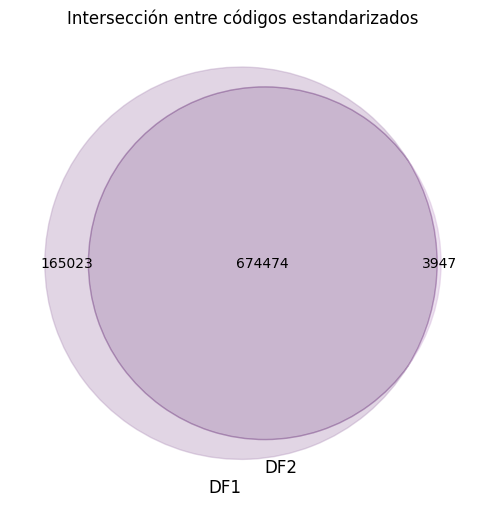

,Categoría,Cantidad,Porcentaje (%)
0,Solo DF1,165023,19.57
1,Solo DF2,3947,0.47
2,Intersección,674474,79.97


In [11]:
## Estandariza Codigos (Mismo Len mismo formato)
gdf_construcciones = estandarizar_codigo(gdf_construcciones, 'LOTECODIGO', 'Barmanpre_estandar', 13)
df_predios_residencial = estandarizar_codigo(df_predios_residencial, 'Barmanpre', 'Barmanpre_estandar', 13)
## Analisis Grafico
df_resumen=analizar_interseccion_codigos(gdf_construcciones,df_predios_residencial,'Barmanpre_estandar')
display(df_resumen)

Bases:

- `DF1` = Construcciones
- `DF2` = Predidos

Candidato:
`CONCODIGO` ➝ `PreCedCata`

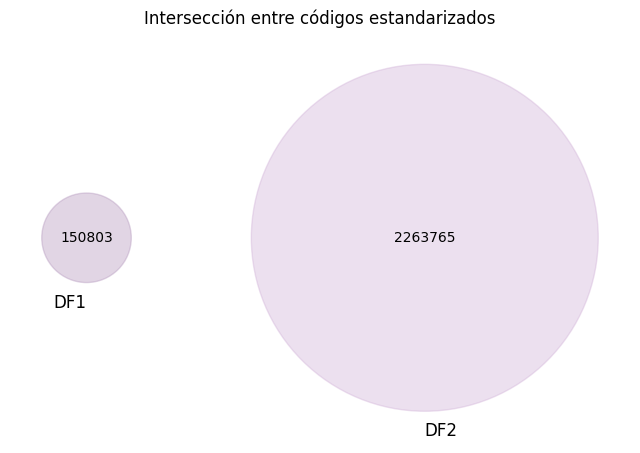

,Categoría,Cantidad,Porcentaje (%)
0,Solo DF1,150803,6.25
1,Solo DF2,2263765,93.75
2,Intersección,0,0.00


In [12]:
## Estandariza Codigos (Mismo Len mismo formato)
gdf_construcciones = estandarizar_codigo(gdf_construcciones,'CONCODIGO' , 'PreCedCata_estandar', 20)
df_predios_residencial = estandarizar_codigo(df_predios_residencial,'PreCedCata', 'PreCedCata_estandar', 20)
## Analisis Grafico
df_resumen=analizar_interseccion_codigos(gdf_construcciones,df_predios_residencial,'PreCedCata_estandar')
display(df_resumen)

Bases:

- `DF1` = Construcciones
- `DF2` = Predidos

Candidato:
`CONCODIGO` ➝ `PreNupre`

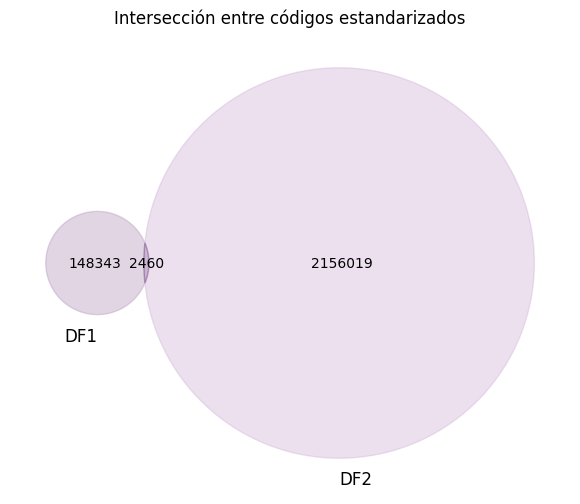

,Categoría,Cantidad,Porcentaje (%)
0,Solo DF1,148343,6.43
1,Solo DF2,2156019,93.46
2,Intersección,2460,0.11


In [13]:
## Estandariza Codigos (Mismo Len mismo formato)
gdf_construcciones = estandarizar_codigo(gdf_construcciones, 'CONCODIGO', 'PreNupre_estandar', 20)
df_predios_residencial = estandarizar_codigo(df_predios_residencial,'PreNupre' , 'PreNupre_estandar', 20)
## Analisis Grafico
df_resumen=analizar_interseccion_codigos(gdf_construcciones,df_predios_residencial,'PreNupre_estandar')
display(df_resumen)

**2. Uso de `Barmanpre` como proxy de lote para vinculación espacial**

La variable `Barmanpre` actúa como una **proxy efectiva del lote catastral** y permite **agrupar predios que comparten una misma unidad constructiva o predial**. Esta codificación, presente en la base de datos de predios de Bogotá, resulta especialmente útil en contextos donde no se cuenta con geometrías detalladas de predios individuales o se busca **reducir la complejidad y el tamaño de las bases de datos** para análisis masivos.

Además de simplificar el manejo de datos, `Barmanpre` **facilita la vinculación con la base de datos de construcciones**, la cual es crítica para acceder a información geométrica de edificaciones como áreas construidas, número de pisos o tipologías estructurales. Dado que ambas bases comparten este identificador, el cruce resulta **altamente factible y robusto (Graficos)**.

Por tanto, `Barmanpre` permite establecer una conexión espacial coherente entre predios y construcciones, y a su vez, extender este vínculo hacia otras capas territoriales como las **Unidades de Planeamiento Local (UPL)**, con fines de visualización, análisis urbano y evaluación territorial.

---

Hacer un join espacial entre la base de datos de predios y la de UPLs y calcular cuántos predios residenciales existen en Bogotá por UPL.

**Pipe:**

Agrupar/Filtrar ➝ Cruce Geográfico ➝ Cruzar con predios ➝ Visualizar

In [14]:
## Volver lotes para manejar una base mas pequenna (Agrupar a Unidad de cruce)
df_predios_residencial_lote= df_predios_residencial.groupby('Barmanpre_estandar').agg(
    n_predios_residenciales=('OBJECTID', 'nunique'),
    PreCBarrio=('PreCBarrio', 'first'),
    PreNBarrio=('PreNBarrio','first')
).reset_index()
df_predios_residencial_lote.head()

,Barmanpre_estandar,n_predios_residenciales,PreCBarrio,PreNBarrio
0,0001101002001,1,1101,LAS BRISAS
1,0001101002002,2,1101,LAS BRISAS
2,0001101002003,2,1101,LAS BRISAS
3,0001101002004,1,1101,LAS BRISAS
4,0001101002005,1,1101,LAS BRISAS


In [15]:
# Agrupar y unir geometrías por 'Barmanpre_estandar' (Agrupar a Unidad de Cruce)
gdf_lotes = gdf_construcciones[['Barmanpre_estandar', 'geometry']].dissolve(
    by='Barmanpre_estandar',     # campo de agrupación
    as_index=False               # mantener columna como columna, no índice
)  # conservar solo lo necesario
gdf_lotes.head()

,Barmanpre_estandar,geometry
0,0000000000000,"MULTIPOLYGON (((-74.11465 4.53265, -74.11466 4..."
1,0000004521032,"POLYGON ((-74.18992 4.59947, -74.18992 4.59947..."
2,0001101001001,"POLYGON ((-74.08186 4.58470, -74.08186 4.58466..."
3,0001101001002,"POLYGON ((-74.08190 4.58474, -74.08188 4.58474..."
4,0001101001003,"POLYGON ((-74.08188 4.58478, -74.08188 4.58474..."


In [16]:
# Vamos a Transformar Poligono A centroide Para que el cruce sea mas eficiente con UPLS
gdf_lotes_centroides=obtener_centroides(gdf_lotes)
gdf_lotes_centroides.head()

,Barmanpre_estandar,geometry
0,0000000000000,POINT (-74.12046 4.56515)
1,0000004521032,POINT (-74.18996 4.59948)
2,0001101001001,POINT (-74.08187 4.58465)
3,0001101001002,POINT (-74.08185 4.58470)
4,0001101001003,POINT (-74.08189 4.58476)


**Visualizar Poligonos VS PUntos**
Objetivo:
- Entender la relacion de Poligonos Cons ➝  UPLS
- Ebtender la Relacion de Puntos Cons ➝  UPLS
- Comparar las relacion Visualmente

In [23]:
# Filtramos la columnas de UPLS para aligerar el manejo
variables_importantes_upl=["CODIGO_UPL","NOMBRE","VOCACION","SECTOR","AREA_HA","geometry"]
gdf_upl_filtrado=gdf_upl[variables_importantes_upl]

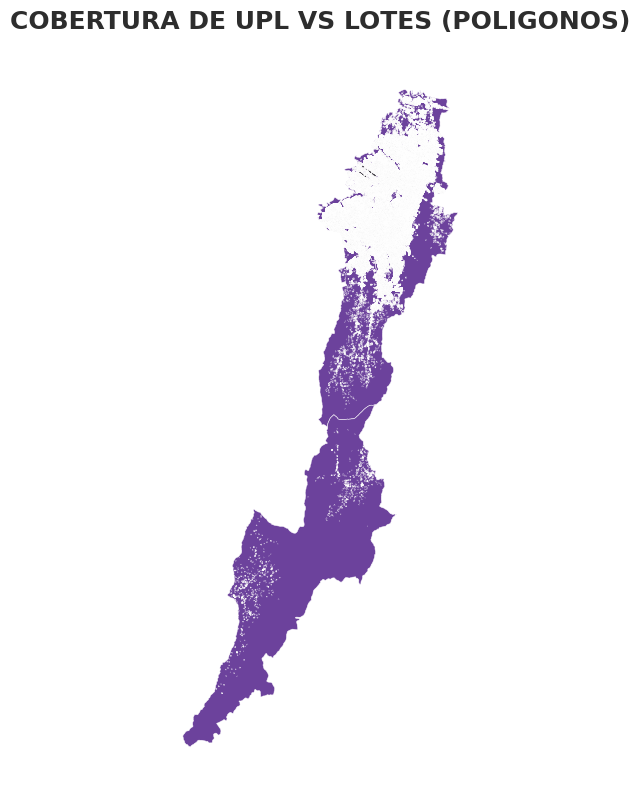

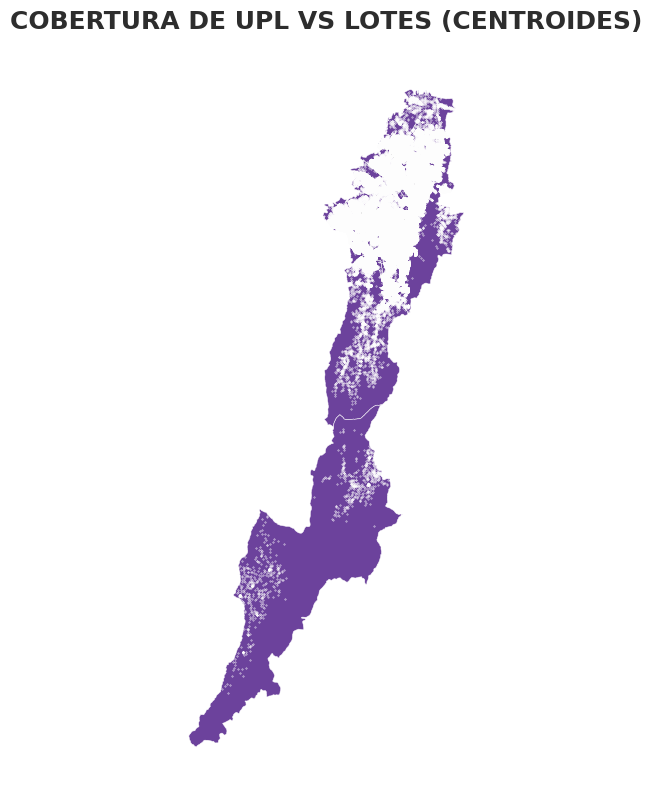

In [24]:
## Poligonos
graficar_upl_vs_inmuebles(gdf_upl, gdf_lotes,titulo="Cobertura de UPL vs Lotes (Poligonos)", color_geometry="#FFFFFF")
## Puntos
graficar_upl_vs_inmuebles(gdf_upl, gdf_lotes_centroides,titulo="Cobertura de UPL vs Lotes (Centroides)", color_geometry="#FFFFFF")

No hay cambios notorios, y el manejo de contenencia punto a polígono es mucho más eficiente.

**Funcion de Cruce**

In [25]:
# procesamiento UPLS
upls_preparados = preparar_upls(gdf_upl_filtrado)

# Puntos a UPLS
gdf_lotes_upl_centroides= cruzar_puntos_con_upl(
    gdf_puntos=gdf_lotes_centroides,
    upls_preparados=upls_preparados,
    metodo_cruce=asignar_upl_contains,
    col_salida='CODIGO_UPL'
)

# Cruzar Fuentes
df_mapa_2_upl_construcciones=gdf_lotes_upl_centroides.drop(columns='geometry').merge(gdf_upl_filtrado, on='CODIGO_UPL',how='left')
df_mapa_2=df_predios_residencial_lote.merge(df_mapa_2_upl_construcciones,on='Barmanpre_estandar',how='left')
## Lenar
df_mapa_2[['CODIGO_UPL','NOMBRE']]=df_mapa_2[['CODIGO_UPL','NOMBRE']].fillna('No_Determinado')

Aplicando cruce: CODIGO_UPL: 100%|██████████| 839497/839497 [02:30<00:00, 5562.99it/s]


In [33]:
# Totales
total = df_mapa_2['n_predios_residenciales'].sum()
display(
    f"Total predios residenciales: {total:,}"
)
df_mapa_2.groupby(['CODIGO_UPL','NOMBRE']).agg(
                    predios_residenciales=('n_predios_residenciales', 'sum'),
                    ).reset_index().sort_values(by='predios_residenciales',ascending=False).reset_index(drop=True)

'Total predios residenciales: 2,651,472'

,CODIGO_UPL,NOMBRE,predios_residenciales
0,UPL25,Usaquén,230597
1,UPL08,Britalia,156144
2,UPL27,Niza,134052
3,UPL11,Engativá,123984
4,UPL24,Chapinero,119653
5,UPL26,Toberín,109997
6,UPL20,Rafael Uribe,109067
7,UPL29,Tabora,105274
8,UPL13,Tintal,104642
9,UPL03,Arborizadora,104152


In [34]:
widget_tabla_propiedades(df_mapa_2)

Output()